Submitted by:
Maham Waseem (27257) 

Hierarchical Clustering

Importing the required dependencies

In [81]:

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from scipy.stats import chi2_contingency
from sklearn.feature_selection import f_classif
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

Creating Functions 
</br>
1-LoadData </br>
2-CleanFun </br>
3-KYFS </br>
4-FTRsclt </br>
5-PCAViz </br>
6-ClusterFun </br>
7-VizFun </br>

1. LoadData

In [83]:
import chardet
import pandas as pd

def LoadData(Loc):
    # Read the raw data to detect encoding
    rawdata = open(Loc, 'rb').read()
    result = chardet.detect(rawdata)

    # Read the CSV file using the detected encoding
    data = pd.read_csv(Loc, encoding=result['encoding'])

    return data



Noise Removal Function

In [135]:
import pandas as pd

def remove_outliers_iqr(data):
    # Copy the data to avoid modifying the original data
    clean_data = data.copy()

    # Loop through each column in the data
    for column in clean_data.select_dtypes(include=['float64', 'int64']).columns:  # Only numeric columns
        Q1 = clean_data[column].quantile(0.25)  # 1st quartile
        Q3 = clean_data[column].quantile(0.75)  # 3rd quartile
        IQR = Q3 - Q1  # Interquartile Range
        
        # Calculate the lower and upper bounds for outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Filter the data to remove outliers
        clean_data = clean_data[(clean_data[column] >= lower_bound) & (clean_data[column] <= upper_bound)]
        
    return clean_data


2. CleanFun

In [87]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
import pandas as pd
import numpy as np

def CleanData(df):
    """
    Generalized function to clean a dataset with categorical, integer, binary, continuous, and boolean data types.
    - Automatically handles missing values, encodes categorical data, and scales continuous and integer data.
    
    Parameters:
    - df: The input DataFrame.
    
    Returns:
    - df_cleaned: The cleaned and transformed DataFrame.
    """
    # Step 1: Handle special missing value representations ("?" in this dataset)
    df.replace('?', np.nan, inplace=True)
    
    # Step 2: Detect column types
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    continuous_cols = df.select_dtypes(include=['float64', 'float32']).columns.tolist()
    integer_cols = df.select_dtypes(include=['int64', 'int32']).columns.tolist()
    
    # Detect binary columns (those with exactly 2 unique values)
    binary_cols = [col for col in df.columns if df[col].nunique() == 2]
    
    # Detect boolean columns
    boolean_cols = df.select_dtypes(include=['bool']).columns.tolist()

    # Convert boolean columns to integers (0 and 1)
    df[boolean_cols] = df[boolean_cols].astype(int)

    # Remove binary and boolean columns from integer cols since they are handled separately
    integer_cols = [col for col in integer_cols if col not in binary_cols + boolean_cols]

    # Step 3: Handle missing values
    # Fill missing continuous values with the mean
    if continuous_cols:
        imputer_cont = SimpleImputer(strategy='mean')
        df[continuous_cols] = imputer_cont.fit_transform(df[continuous_cols])
    
    # Fill missing integer values with the median
    if integer_cols:
        imputer_int = SimpleImputer(strategy='median')
        df[integer_cols] = imputer_int.fit_transform(df[integer_cols])
    
    # Fill missing categorical values with the most frequent value (mode)
    if categorical_cols:
        imputer_cat = SimpleImputer(strategy='most_frequent')
        df[categorical_cols] = imputer_cat.fit_transform(df[categorical_cols])
    
    # Fill missing binary values with the mode
    if binary_cols:
        imputer_bin = SimpleImputer(strategy='most_frequent')
        df[binary_cols] = imputer_bin.fit_transform(df[binary_cols])
    
    # Step 4: Encode categorical variables (One-hot encoding)
    df_encoded = pd.get_dummies(df, columns=categorical_cols, drop_first=True)
    
    # Step 5: Scale continuous and integer variables
    scaler = StandardScaler()
    if continuous_cols:
        df_encoded[continuous_cols] = scaler.fit_transform(df_encoded[continuous_cols])
    if integer_cols:
        df_encoded[integer_cols] = scaler.fit_transform(df_encoded[integer_cols])
    
    return df_encoded



In [89]:

def list_columns_with_missing_values(df):
    result=df.isnull().sum(0)
    return result


def drop_null(df): #This function will clean the dataset by dropping null values.
    df.dropna(inplace=True)
    return(df)


def fill_null_mean(df):

    df_float = df.select_dtypes(include='float64').columns.tolist()
    # Make a copy of float columns
    X = df[df_float].copy()

    # Calculate means of each column
    means = X.mean()

    # Fill missing values with mean values
    X.fillna(value=means, inplace=True)

    # Assign the filled float columns back to the original DataFrame
    df[df_float] = X

    return df



def CleanFun(data): #This function will clean the dataset.
    
    print("Number of missing values in your data set:",list_columns_with_missing_values(data))

    print("Number of duplicate rows in your data set:",data.duplicated().sum())
    print("All the missing values have been filled wtih mean values")
    print("All the duplicate rows have been deleted from data set")
    
 
    data.drop_duplicates(inplace=True)
    data = fill_null_mean(data)
    return(data)




Remove Noise Function based on the 1 % of extreme values

In [91]:
def remove_noise_quantile(data, lower_quantile=0.01, upper_quantile=0.99, output_file="cleaned_data.csv"):
    """
    Removes noise from the dataset based on quantiles and saves the cleaned data.

    Parameters:
    data (pd.DataFrame): The input dataset to clean.
    lower_quantile (float): The lower quantile threshold for outliers (e.g., 0.01 for the 1st percentile).
    upper_quantile (float): The upper quantile threshold for outliers (e.g., 0.99 for the 99th percentile).
    output_file (str): The path to save the cleaned dataset.

    Returns:
    pd.DataFrame: The cleaned dataset without the noisy data.
    """
    # Calculate quantile-based lower and upper bounds for each column
    lower_bound = data.quantile(lower_quantile)
    upper_bound = data.quantile(upper_quantile)

    # Create a mask to filter out noisy rows
    mask = ~((data < lower_bound) | (data > upper_bound)).any(axis=1)
    cleaned_data = data[mask]

    # Save the cleaned data to a CSV file
    cleaned_data.to_csv(output_file, index=False)

    print(f"Cleaned data saved to '{output_file}' with {len(cleaned_data)} records out of {len(data)} total records.")
    return cleaned_data


3. KYFS

In [93]:
def KYFS(df):

    desc = pd.DataFrame(index = list(df))
    desc['type'] = df.dtypes
    desc['count'] = df.count()
    desc['nunique'] = df.nunique()
    desc['%unique'] = desc['nunique'] / len(df) * 100
    desc['null'] = df.isnull().sum()
    desc['%null'] = desc['null'] / len(df) * 100
    desc['min'] = df.min()
    desc['max'] = df.max()
    return desc;

In [95]:
def ViewColumnTypes(df):
    """
    View which columns are categorical, continuous, integer, and binary.

    Parameters:
    - df: The input DataFrame.

    Returns:
    - A dictionary containing column names categorized by type.
    """
    # Step 1: Get columns by data types
    categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
    continuous_cols = df.select_dtypes(include=['float64', 'float32']).columns.tolist()
    integer_cols = df.select_dtypes(include=['int64', 'int32']).columns.tolist()
    
    # Step 2: Identify binary columns (those with exactly two unique values)
    binary_cols = [col for col in df.columns if df[col].nunique() == 2]
    
    # Print the results
    print(f"Categorical Columns: {categorical_cols}")
    print(f"Continuous Columns: {continuous_cols}")
    print(f"Integer Columns: {integer_cols}")
    print(f"Binary Columns: {binary_cols}")
    
    # Return the results in a dictionary (for potential future use)
    return {
        "categorical_cols": categorical_cols,
        "continuous_cols": continuous_cols,
        "integer_cols": integer_cols,
        "binary_cols": binary_cols
    }


4. FTRsclt

In [97]:
def FtrSlct(df, hist_color='MAROON', boxplot_color='MAROON'):
    # Separating numerical and categorical features
    numeric_features = df.select_dtypes(include=['float64','int64','int32'])
    categorical_features = df.select_dtypes(include=['object', 'int64'])

    # Summary statistics
    summary_stats = numeric_features.describe().style.set_properties(**{'color': 'maroon', 'text-align': 'center', 'font-weight': 'bold'})
    print("\n\033[1m\033[91mSummary Statistics:\033[0m")
    display(summary_stats)


    num_cols = len(numeric_features.columns)
    num_rows = (num_cols - 1) // 3 + 1  # Calculate number of rows needed

    # Histograms and Box plots
    fig, axes = plt.subplots(nrows=num_rows*2, ncols=3, figsize=(16, 5*num_rows))

    for i, column in enumerate(numeric_features.columns):
        row = i // 3
        col = i % 3

        sns.histplot(df[column], bins=20, kde=True, color=hist_color, ax=axes[row*2, col])
        axes[row*2, col].set_title(f'Histogram of {column}')
        axes[row*2, col].set_xlabel(column)
        axes[row*2, col].set_ylabel('Frequency')

        sns.boxplot(data=df, y=column, color=boxplot_color, ax=axes[row*2+1, col])
        axes[row*2+1, col].set_title(f'Boxplot of {column}')
        axes[row*2+1, col].set_ylabel(column)

    plt.tight_layout()
    plt.show()

    # Correlation matrix
    # Calculate correlation matrix
    correlation_matrix = numeric_features.corr()

    # Correlation matrix
    plt.figure(figsize=(30, 30))
    sns.heatmap(correlation_matrix, cmap="coolwarm", annot=True, fmt=".2f", linewidths=1)
    plt.title('Correlation Heatmap of 30 Variables')
    plt.xlabel('Variables')
    plt.ylabel('Variables')
    plt.show()



In [ ]:
#Cluster Visualization in High Dimensionality to check all the features working in every single clusters

In [ ]:
#Heatmap Function

In [99]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.preprocessing import MinMaxScaler

def HeatmapFeatureMeans(df, n_clusters, linkage_type='ward'):
    """
    Plot side-by-side heatmaps showing the normalized mean values of original features
    for each cluster using both K-means and Hierarchical clustering methods after Min-Max scaling.
    
    Parameters:
    - df: DataFrame with original features.
    - n_clusters: The number of clusters to use for both K-means and hierarchical clustering.
    - linkage_type: The linkage criterion to use for hierarchical clustering ('ward', 'complete', 'average', 'single').
    """
    # Min-Max scaling the features to range [0, 1]
    scaler = MinMaxScaler()
    df_scaled = scaler.fit_transform(df)
    df_scaled = pd.DataFrame(df_scaled, columns=df.columns)

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(df_scaled)

    # Perform hierarchical clustering
    hierarchical = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage_type)
    hierarchical_labels = hierarchical.fit_predict(df_scaled)

    # Function to plot the heatmap for each clustering method
    def plot_heatmap(data, labels, title, ax):
        # Assign clusters and calculate mean feature values for each cluster
        data['Cluster'] = labels
        cluster_means = data.groupby('Cluster').mean()
        data.drop(columns=['Cluster'], inplace=True)  # Remove 'Cluster' after grouping

        # Plot heatmap of the cluster means
        sns.heatmap(cluster_means, annot=True, cmap="viridis", cbar=True, ax=ax)
        ax.set_title(title, size=15)
        ax.set_xlabel("Features")
        ax.set_ylabel("Clusters")

    # Create side-by-side plots for K-means and Hierarchical clustering heatmaps
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))

    # Plot K-means clustering results
    plot_heatmap(df_scaled.copy(), kmeans_labels, 'K-means Clustering', axs[0])

    # Plot hierarchical clustering results
    plot_heatmap(df_scaled.copy(), hierarchical_labels, f'Hierarchical Clustering ({linkage_type.capitalize()} Linkage)', axs[1])

    plt.tight_layout()  # Adjust subplots to give some padding
    plt.show()

# Example usage:
# HeatmapFeatureMeans(dataframe, n_clusters=3, linkage_type='average')


In [ ]:
#Bar Plot

In [101]:
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans, AgglomerativeClustering
import pandas as pd

def StackedBarPlotFeatureContributions(df, n_clusters, linkage_type='ward'):
    """
    Plot side-by-side stacked bar charts showing the relative contribution of each feature
    within each cluster using both K-means and Hierarchical clustering methods after normalizing the features (0-1 scaling).
  
    Parameters:
    - df: DataFrame with original features.
    - n_clusters: The number of clusters to use for both K-means and hierarchical clustering.
    - linkage_type: The linkage criterion to use for hierarchical clustering ('ward', 'complete', 'average', 'single').
    """
    # Normalize the features using MinMaxScaler (0-1 scaling)
    scaler = MinMaxScaler()
    df_scaled = scaler.fit_transform(df)

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(df_scaled)
  
    # Perform hierarchical clustering
    hierarchical = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage_type)
    hierarchical_labels = hierarchical.fit_predict(df_scaled)

    # Define function to calculate and plot stacked bar chart for each clustering method
    def plot_stacked_bar_chart(data, labels, title, ax):
        data['Cluster'] = labels
        cluster_means = data.groupby('Cluster').mean()
        data.drop(columns=['Cluster'], inplace=True)  # Remove 'Cluster' after grouping
  
        # Plot stacked bar chart for each cluster
        cluster_means.plot(kind='bar', stacked=True, ax=ax, figsize=(10, 6))
        ax.set_title(title)
        ax.set_xlabel('Clusters')
        ax.set_ylabel('Normalized Feature Contribution')
        ax.grid(True)

        # Resize and reposition the legend (Top Right)
        legend = ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1), fontsize='xx-small', title='Features', title_fontsize='xx-small')
        frame = legend.get_frame()
        frame.set_facecolor('none')  # Transparent background for legend

    # Create side-by-side plots
    fig, axs = plt.subplots(1, 2, figsize=(14, 8))

    # Plot K-means clustering results
    plot_stacked_bar_chart(pd.DataFrame(df_scaled, columns=df.columns), kmeans_labels, 'K-means Clustering', axs[0])

    # Plot hierarchical clustering results
    plot_stacked_bar_chart(pd.DataFrame(df_scaled, columns=df.columns), hierarchical_labels, f'Hierarchical Clustering ({linkage_type.capitalize()} Linkage)', axs[1])

    plt.tight_layout()  # Adjust subplots to give some padding
    plt.show()

# Example usage:
# StackedBarPlotFeatureContributions(dataframe, n_clusters=3, linkage_type='average')


In [ ]:
#Radial Plot Visualization

In [103]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.preprocessing import MinMaxScaler

def RadialChartFeatureMeans(df, n_clusters, linkage_type='ward'):
    """
    Plot side-by-side radial charts showing the mean values of original features for each cluster
    using both K-means and Hierarchical clustering methods after normalizing the features (0-1 scaling).
    
    Parameters:
    - df: DataFrame with original features.
    - n_clusters: The number of clusters to use for both K-means and hierarchical clustering.
    - linkage_type: The linkage criterion to use for hierarchical clustering ('ward', 'complete', 'average', 'single').
    """
    # Normalize the features using MinMaxScaler (0-1 scaling)
    scaler = MinMaxScaler()
    df_scaled = scaler.fit_transform(df)

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(df_scaled)

    # Perform hierarchical clustering
    hierarchical = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage_type)
    hierarchical_labels = hierarchical.fit_predict(df_scaled)

    # Define function to calculate and plot radial chart for each clustering method
    def plot_radial_chart(data, labels, title, ax, offset=0):
        data['Cluster'] = labels
        cluster_means = data.groupby('Cluster').mean()
        data.drop(columns=['Cluster'], inplace=True)  # Remove 'Cluster' after grouping

        categories = cluster_means.columns
        N = len(categories)
        angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
        angles += angles[:1]

        # Plot each cluster's values with an offset
        for i, row in cluster_means.iterrows():
            values = row.tolist()
            values += values[:1]

            # Add offset to each value for visibility
            values_with_offset = [v + offset for v in values]
            ax.plot(angles, values_with_offset, label=f'Cluster {i}')
            ax.fill(angles, values_with_offset, alpha=0.1)

        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(categories, fontsize=10)
        ax.set_title(title, size=15)
        ax.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

    # Create side-by-side plots
    fig, axs = plt.subplots(1, 2, figsize=(14, 8), subplot_kw=dict(polar=True))

    # Plot K-means clustering results with an offset for better visibility
    plot_radial_chart(pd.DataFrame(df_scaled, columns=df.columns), kmeans_labels, 'K-means Clustering', axs[0], offset=0)

    # Plot hierarchical clustering results with an increased offset for visibility
    plot_radial_chart(pd.DataFrame(df_scaled, columns=df.columns), hierarchical_labels, f'Hierarchical Clustering ({linkage_type.capitalize()} Linkage)', axs[1], offset=1)

    plt.tight_layout()  # Adjust subplots to give some padding
    plt.show()

# Example usage:
# RadialChartFeatureMeans(dataframe, n_clusters=3, linkage_type='average')


In [193]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import MinMaxScaler

def RadialChartWithGroupedDataPoints(df, n_clusters, linkage_type='ward'):
    """
    Visualizes clusters in a radial plot, with data points grouped according to clusters. 
    Larger clusters have more points in the radial layout. 

    Parameters:
    - df: DataFrame with original features.
    - n_clusters: The number of clusters to use for hierarchical clustering.
    - linkage_type: The linkage criterion to use for hierarchical clustering ('ward', 'complete', 'average', 'single').
    """
    # Normalize the features using MinMaxScaler (0-1 scaling)
    scaler = MinMaxScaler()
    df_scaled = scaler.fit_transform(df)

    # Perform hierarchical clustering
    hierarchical = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage_type)
    hierarchical_labels = hierarchical.fit_predict(df_scaled)

    # Create a DataFrame with the labels
    df_clustered = df.copy()
    df_clustered['Cluster'] = hierarchical_labels

    # Define function to plot radial chart with grouped data points
    def plot_radial_chart_with_groups(data, ax):
        N = len(data.columns)
        angles = np.linspace(0, 2 * np.pi, N, endpoint=False).tolist()
        angles += angles[:1]  # Close the loop

        # For each cluster, place the data points along the radial
        for cluster in data['Cluster'].unique():
            cluster_data = data[data['Cluster'] == cluster]
            # Calculate mean feature values for the cluster
            cluster_means = cluster_data.drop(columns=['Cluster']).mean()

            # Plot each data point for the cluster
            for i, row in cluster_data.iterrows():
                values = row.drop('Cluster').tolist()
                values += values[:1]  # Close the loop
                # Plot the data point for the current cluster
                ax.scatter(angles, values, label=f'Cluster {cluster}', s=40, alpha=0.7)

            # Optionally, highlight the cluster mean
            cluster_means = cluster_means.tolist()
            cluster_means += cluster_means[:1]
            ax.scatter(angles, cluster_means, s=100, label=f'Mean of Cluster {cluster}', edgecolors='black', zorder=5)

        ax.set_xticks(angles[:-1])
        ax.set_xticklabels(data.columns, fontsize=10)
        ax.set_title(f'Radial Cluster Plot with Data Points ({linkage_type.capitalize()} Linkage)', size=15)
        ax.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))

    # Create a figure for the radial chart with grouped data points
    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

    # Plot the radial chart with groups of data points
    plot_radial_chart_with_groups(df_clustered, ax)

    plt.show()

# Example usage:
# RadialChartWithGroupedDataPoints(dataframe, n_clusters=3, linkage_type='average')


In [ ]:
#For low dimensionality visualization

5. PCAViz

In [105]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
import matplotlib.pyplot as plt

def PCA_with_KMeans_and_Hierarchical(data, n_clusters=3, linkage_type='ward'):
    """
    Perform PCA on the data, then apply both K-means and hierarchical clustering.
    Display the PCA-reduced data with both clustering results side-by-side.
    
    Parameters:
    - data: The dataset to reduce and cluster.
    - n_clusters: The number of clusters for both K-means and hierarchical clustering.
    - linkage_type: The linkage criterion to use for hierarchical clustering ('ward', 'complete', 'average', 'single').
    """
    # Normalize the data using MinMaxScaler (0-1 scaling)
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(data)
    
    # Apply PCA
    pca = PCA(n_components=2)
    pca_data = pca.fit_transform(scaled_data)
    
    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(pca_data)
    kmeans_centroids = kmeans.cluster_centers_
    
    # Apply Hierarchical clustering
    hierarchical = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage_type)
    hierarchical_labels = hierarchical.fit_predict(pca_data)
    
    # Plotting the results
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))
    
    # Plot K-means clustering results
    scatter1 = axs[0].scatter(pca_data[:, 0], pca_data[:, 1], c=kmeans_labels, cmap='viridis', s=50, alpha=0.6)
    axs[0].scatter(kmeans_centroids[:, 0], kmeans_centroids[:, 1], c='red', s=200, marker='X', label='Centroids')
    axs[0].set_title('PCA with K-means Clustering')
    axs[0].set_xlabel('PCA Component 1')
    axs[0].set_ylabel('PCA Component 2')
    axs[0].legend()
    plt.colorbar(scatter1, ax=axs[0], label='Cluster')
    
    # Plot Hierarchical clustering results
    scatter2 = axs[1].scatter(pca_data[:, 0], pca_data[:, 1], c=hierarchical_labels, cmap='viridis', s=50, alpha=0.6)
    axs[1].set_title(f'PCA with Hierarchical Clustering ({linkage_type.capitalize()} Linkage)')
    axs[1].set_xlabel('PCA Component 1')
    axs[1].set_ylabel('PCA Component 2')
    plt.colorbar(scatter2, ax=axs[1], label='Cluster')
    
    plt.show()

# Example usage:
# PCA_with_KMeans_and_Hierarchical(data, n_clusters=3, linkage_type='average')


In [ ]:
#TSNE

In [107]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, AgglomerativeClustering
import matplotlib.pyplot as plt

def tSNE_with_KMeans_and_Hierarchical(data, n_clusters=3, linkage_type='ward'):
    """
    Perform t-SNE on the data, then apply both K-means and hierarchical clustering.
    Display the t-SNE-reduced data with both clustering results side-by-side.
    
    Parameters:
    - data: The dataset to reduce and cluster.
    - n_clusters: The number of clusters for both K-means and hierarchical clustering.
    - linkage_type: The linkage criterion to use for hierarchical clustering ('ward', 'complete', 'average', 'single').
    """
    # Normalize the data using MinMaxScaler (0-1 scaling)
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(data)
    
    # Apply t-SNE
    tsne = TSNE(n_components=2, random_state=42)
    tsne_data = tsne.fit_transform(scaled_data)
    
    # Apply K-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(tsne_data)
    kmeans_centroids = kmeans.cluster_centers_
    
    # Apply Hierarchical clustering
    hierarchical = AgglomerativeClustering(n_clusters=n_clusters, linkage=linkage_type)
    hierarchical_labels = hierarchical.fit_predict(tsne_data)
    
    # Plotting the results
    fig, axs = plt.subplots(1, 2, figsize=(16, 8))
    
    # Plot K-means clustering results
    scatter1 = axs[0].scatter(tsne_data[:, 0], tsne_data[:, 1], c=kmeans_labels, cmap='viridis', s=50, alpha=0.6)
    axs[0].scatter(kmeans_centroids[:, 0], kmeans_centroids[:, 1], c='red', s=200, marker='X', label='Centroids')
    axs[0].set_title('t-SNE with K-means Clustering')
    axs[0].set_xlabel('t-SNE Component 1')
    axs[0].set_ylabel('t-SNE Component 2')
    axs[0].legend()
    plt.colorbar(scatter1, ax=axs[0], label='Cluster')
    
    # Plot Hierarchical clustering results
    scatter2 = axs[1].scatter(tsne_data[:, 0], tsne_data[:, 1], c=hierarchical_labels, cmap='viridis', s=50, alpha=0.6)
    axs[1].set_title(f't-SNE with Hierarchical Clustering ({linkage_type.capitalize()} Linkage)')
    axs[1].set_xlabel('t-SNE Component 1')
    axs[1].set_ylabel('t-SNE Component 2')
    plt.colorbar(scatter2, ax=axs[1], label='Cluster')
    
    plt.show()

# Example usage:
# tSNE_with_KMeans_and_Hierarchical(data, n_clusters=3, linkage_type='average')


6. ClusterFun

In [109]:
import numpy as np
import pandas as pd
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler

def ClusterFun(data, linkage_method='ward'):
    """
    Performs hierarchical clustering with min-max normalization and plots a dendrogram 
    to help determine the optimal number of clusters.

    Parameters:
    - data: The dataset to cluster (2D numpy array or pandas DataFrame).
    - linkage_method: The linkage criterion to use (e.g., 'ward', 'single', 'complete', 'average').
    """
    # Normalize the data to a 0-1 range
    scaler = MinMaxScaler()
    data_normalized = scaler.fit_transform(data)
    
    # Perform hierarchical clustering with specified linkage method
    linked = linkage(data_normalized, method=linkage_method)
    
    # Plot the dendrogram
    plt.figure(figsize=(10, 7))
    dendrogram(linked, truncate_mode='lastp', p=10, show_leaf_counts=True)
    plt.title(f'Dendrogram for Hierarchical Clustering (Linkage: {linkage_method})')
    plt.xlabel('Cluster Size')
    plt.ylabel('Distance')
    plt.show()

# Example usage:
# Assume 'data' is your DataFrame or 2D numpy array.
# ClusterFun(data, linkage_method='complete')  # You can change the linkage method here.


In [111]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

def feature_clustering_dendrogram(data, linkage_type='ward'):
    """
    Create a dendrogram based on feature clustering with normalization (0-1).
    
    Parameters:
    - data: A pandas DataFrame where each column is a feature.
    - linkage_type: Type of linkage method to use ('single', 'complete', 'average', 'ward').
    
    This function will cluster the features instead of data points.
    """
    # Normalize the data to the range [0, 1]
    scaler = MinMaxScaler()
    normalized_data = scaler.fit_transform(data)
    
    # Transpose data to make each row represent a feature (because clustering is done on features)
    feature_data = pd.DataFrame(normalized_data, columns=data.columns, index=data.index)
    
    # Calculate the pairwise distances between features
    dist_matrix = pdist(feature_data.T, metric='euclidean')
    
    # Perform hierarchical clustering on the features
    linkage_matrix = linkage(dist_matrix, method=linkage_type)
    
    # Plot the dendrogram
    plt.figure(figsize=(10, 5))
    dendrogram(linkage_matrix, labels=feature_data.columns, leaf_rotation=90)
    plt.title(f'Hierarchical Clustering Dendrogram (Features) - {linkage_type.capitalize()} Linkage')
    plt.xlabel('Feature')
    plt.ylabel('Distance')
    plt.show()

# Example usage:
# Assume 'data' is your DataFrame where each column represents a feature
# Call the function and specify the linkage type
# feature_clustering_dendrogram(data, linkage_type='complete')


In [113]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

def calculate_wcss(data):
    """
    Computes the WCSS for different numbers of clusters after normalizing the data 
    to the 0-1 range to help determine the optimal number of clusters.

    Parameters:
    - data: 2D numpy array or pandas DataFrame
    
    Returns:
    - List of WCSS values for each number of clusters.
    """
    # Normalize the data to a 0-1 range
    scaler = MinMaxScaler()
    data_normalized = scaler.fit_transform(data)
    
    wcss = []
    for i in range(1, 11):
        kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
        kmeans.fit(data_normalized)
        wcss.append(kmeans.inertia_)
    return wcss


In [115]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler

def gap_statistics(data, max_clusters=10, n_reference=10):
    """
    Calculate the Gap Statistic for clustering after normalizing the data to the 0-1 range.

    Parameters:
    - data: The dataset to cluster (2D numpy array or pandas DataFrame).
    - max_clusters: The maximum number of clusters to test.
    - n_reference: The number of reference datasets to generate.

    Returns:
    - gap_values: A list of gap values for each number of clusters.
    - optimal_k: The optimal number of clusters based on the gap statistic.
    """
    # Normalize the data to a 0-1 range
    scaler = MinMaxScaler()
    data_normalized = scaler.fit_transform(data)
    
    # Initialize gap values
    gap_values = []

    # Compute WCSS for actual normalized data
    actual_wcss = []
    for k in range(1, max_clusters + 1):
        kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
        kmeans.fit(data_normalized)
        actual_wcss.append(kmeans.inertia_)

    # Compute gap statistics
    for k in range(1, max_clusters + 1):
        reference_wcss = []
        for _ in range(n_reference):
            random_data = np.random.random_sample(size=data_normalized.shape)
            kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
            kmeans.fit(random_data)
            reference_wcss.append(kmeans.inertia_)

        # Calculate log of WCSS
        log_wcss_random = np.log(np.mean(reference_wcss))
        log_wcss_actual = np.log(actual_wcss[k - 1])
        
        # Calculate Gap statistic
        gap_value = log_wcss_random - log_wcss_actual
        gap_values.append(gap_value)

    # Determine optimal number of clusters
    optimal_k = np.argmax(gap_values) + 1  # +1 because index starts at 0

    return gap_values, optimal_k
#gap_values, optimal_k = gap_statistics(data)
#print("Gap Values:", gap_values)
#print("Optimal K:", optimal_k)


In [117]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler  # Changed to MinMaxScaler
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, fcluster

def calculate_silhouette_scores(data, cluster_nums, linkage_type='ward'):
    """
    Calculate and plot Silhouette Scores for K-means and Hierarchical clustering with different numbers of clusters.
    
    Parameters:
    - data: pd.DataFrame or np.ndarray, the input features for clustering
    - cluster_nums: list of int or single int, the number of clusters to evaluate for both K-means and Hierarchical clustering
    - linkage_type: str, the linkage criterion for hierarchical clustering ('single', 'complete', 'average', 'ward')
    """
    # Ensure cluster_nums is a list
    if isinstance(cluster_nums, int):
        cluster_nums = [cluster_nums]
    elif not isinstance(cluster_nums, list):
        raise TypeError("cluster_nums should be a list of integers or a single integer")

    # Normalize the data using MinMaxScaler (0-1 scaling)
    scaler = MinMaxScaler()
    normalized_data = scaler.fit_transform(data)

    # Prepare lists to store silhouette scores
    kmeans_scores = []
    hierarchical_scores = []

    # Perform K-means clustering and calculate silhouette scores
    for cluster_num in cluster_nums:
        kmeans = KMeans(n_clusters=cluster_num, random_state=42)
        kmeans_labels = kmeans.fit_predict(normalized_data)
        kmeans_silhouette = silhouette_score(normalized_data, kmeans_labels)
        kmeans_scores.append(kmeans_silhouette)

    # Perform Hierarchical clustering
    for cluster_num in cluster_nums:
        # Perform hierarchical clustering using the chosen linkage type
        Z = linkage(normalized_data, method=linkage_type)
        # Assign cluster labels using fcluster
        hierarchical_labels = fcluster(Z, cluster_num, criterion='maxclust')
        hierarchical_silhouette = silhouette_score(normalized_data, hierarchical_labels)
        hierarchical_scores.append(hierarchical_silhouette)

    # Print the results
    print("Cluster Numbers:", cluster_nums)
    print("K-means Silhouette Scores:", kmeans_scores)
    print("Hierarchical Silhouette Scores:", hierarchical_scores)

    # Plot Silhouette Scores for comparison
    plt.figure(figsize=(10, 6))
    bar_width = 0.35
    index = np.arange(len(cluster_nums))

    # Create bars for K-means
    kmeans_bars = plt.bar(index, kmeans_scores, bar_width, label='K-means', color='blue', alpha=0.7)
    # Create bars for Hierarchical
    hierarchical_bars = plt.bar([i + bar_width for i in index], hierarchical_scores, bar_width, label='Hierarchical', color='green', alpha=0.7)

    # Add silhouette score values on top of the bars
    for bar in kmeans_bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 2), ha='center', va='bottom')

    for bar in hierarchical_bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval + 0.01, round(yval, 2), ha='center', va='bottom')

    plt.title('Silhouette Scores Comparison', size=15)
    plt.xlabel('Number of Clusters', fontsize=12)
    plt.ylabel('Silhouette Score', fontsize=12)
    plt.xticks([i + bar_width / 2 for i in index], cluster_nums)  # Center the x-tick labels
    plt.legend()
    plt.grid(axis='y')
    plt.tight_layout()  # Adjust layout to avoid clipping of labels
    plt.show()

# Example usage with your data
# data = pd.DataFrame(...)  # Load your dataset
# cluster_nums = [2, 3, 4, 5]  # List of cluster numbers to evaluate
# linkage_type = 'ward'  # Choose linkage type: 'single', 'complete', 'average', 'ward'
# calculate_silhouette_scores(data, cluster_nums=cluster_nums, linkage_type=linkage_type)


In [119]:
#Davies_bouldin_index

In [121]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import davies_bouldin_score
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import linkage, fcluster

def calculate_davies_bouldin_index(data, cluster_nums, linkage_type='ward', epsilon=0.5, min_samples=5):
    """
    Calculate and plot Davies-Bouldin Index for K-means and Hierarchical clustering with different numbers of clusters.
    
    Parameters:
    - data: pd.DataFrame or np.ndarray, the input features for clustering
    - cluster_nums: list of int or single int, the number of clusters to evaluate for K-means
    - linkage_type: str, the linkage criterion to use ('single', 'complete', 'average', 'ward')
    - epsilon: float, the maximum distance between two samples for DBSCAN (if needed)
    - min_samples: int, the number of samples in a neighborhood for DBSCAN (if needed)
    """
    # Ensure cluster_nums is a list
    if isinstance(cluster_nums, int):
        cluster_nums = [cluster_nums]
    elif not isinstance(cluster_nums, list):
        raise TypeError("cluster_nums should be a list of integers or a single integer")

    # Normalize the data to the range [0, 1]
    scaler = MinMaxScaler()
    normalized_data = scaler.fit_transform(data)

    # Prepare lists to store Davies-Bouldin Index values
    kmeans_dbi = []
    hierarchical_dbi = []

    # Perform K-means clustering and calculate DBI
    for cluster_num in cluster_nums:
        kmeans = KMeans(n_clusters=cluster_num, random_state=42)
        kmeans_labels = kmeans.fit_predict(normalized_data)
        kmeans_dbi_value = davies_bouldin_score(normalized_data, kmeans_labels)
        kmeans_dbi.append(kmeans_dbi_value)

    # Perform Hierarchical clustering with the selected linkage method
    # Linkage method should be one of 'single', 'complete', 'average', or 'ward'
    Z = linkage(normalized_data, method=linkage_type)

    # For each number of clusters, create flat clusters and calculate Davies-Bouldin index
    for cluster_num in cluster_nums:
        hierarchical_labels = fcluster(Z, cluster_num, criterion='maxclust')
        hierarchical_dbi_value = davies_bouldin_score(normalized_data, hierarchical_labels)
        hierarchical_dbi.append(hierarchical_dbi_value)

    # Print the results
    print("Cluster Numbers:", cluster_nums)
    print("K-means Davies-Bouldin Index:", kmeans_dbi)
    print(f"Hierarchical Davies-Bouldin Index ({linkage_type} linkage):", hierarchical_dbi)

    # Plot Davies-Bouldin Index for comparison
    plt.figure(figsize=(10, 6))
    bar_width = 0.35
    index = range(len(cluster_nums))

    # Create bars for K-means
    plt.bar(index, kmeans_dbi, bar_width, label='K-means', color='blue', alpha=0.7)
    # Create bars for Hierarchical clustering
    plt.bar([i + bar_width for i in index], hierarchical_dbi, bar_width, label='Hierarchical', color='green', alpha=0.7)

    plt.title('Davies-Bouldin Index Comparison', size=15)
    plt.xlabel('Number of Clusters', fontsize=12)
    plt.ylabel('Davies-Bouldin Index', fontsize=12)
    plt.xticks([i + bar_width / 2 for i in index], cluster_nums)  # Center the x-tick labels
    plt.legend()
    plt.grid(axis='y')
    plt.tight_layout()  # Adjust layout to avoid clipping of labels
    plt.show()

# Example usage with your data
# data = pd.DataFrame(...)  # Load your dataset
# calculate_davies_bouldin_index(data, cluster_nums=[2, 3, 4, 5], linkage_type='ward')


Master Function

In [123]:
data=LoadData(r'Credit Card Dataset for Clustering.xls')

In [125]:
data.shape
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [23]:
# encoded_data = CleanData(data)

In [127]:
data=CleanFun(data)

Number of missing values in your data set: CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64
Number of duplicate rows in your data set: 0
All the missing values have been filled wtih mean values
All the duplicate rows have been deleted from data set


In [137]:
KYFS(data)

,type,count,nunique,%unique,null,%null,min,max
BALANCE,float64,8950,8871,99.117318,0,0.0,0.000000,19043.13856
BALANCE_FREQUENCY,float64,8950,43,0.480447,0,0.0,0.000000,1.00000
PURCHASES,float64,8950,6203,69.307263,0,0.0,0.000000,49039.57000
ONEOFF_PURCHASES,float64,8950,4014,44.849162,0,0.0,0.000000,40761.25000
INSTALLMENTS_PURCHASES,float64,8950,4452,49.743017,0,0.0,0.000000,22500.00000
CASH_ADVANCE,float64,8950,4323,48.301676,0,0.0,0.000000,47137.21176
PURCHASES_FREQUENCY,float64,8950,47,0.525140,0,0.0,0.000000,1.00000
ONEOFF_PURCHASES_FREQUENCY,float64,8950,47,0.525140,0,0.0,0.000000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,float64,8950,47,0.525140,0,0.0,0.000000,1.00000
CASH_ADVANCE_FREQUENCY,float64,8950,54,0.603352,0,0.0,0.000000,1.50000


In [131]:
data = data.drop(columns=['CUST_ID'])


View types for each feature

In [139]:
column_types = ViewColumnTypes(data)


Categorical Columns: []
Continuous Columns: ['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT']
Integer Columns: ['CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'TENURE']
Binary Columns: []


In [141]:
original_data = data
data2 = data

The data is now cleaned

In [62]:
data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,864.206542,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12



Summary Statistics:


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.612411,2895.063757,2330.588021,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,170.857654,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,335.628312,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,864.206542,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


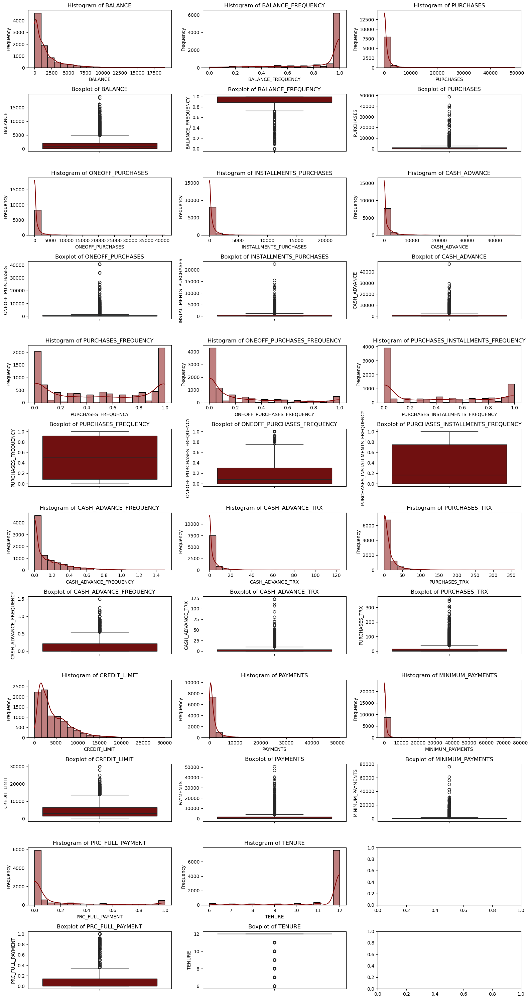

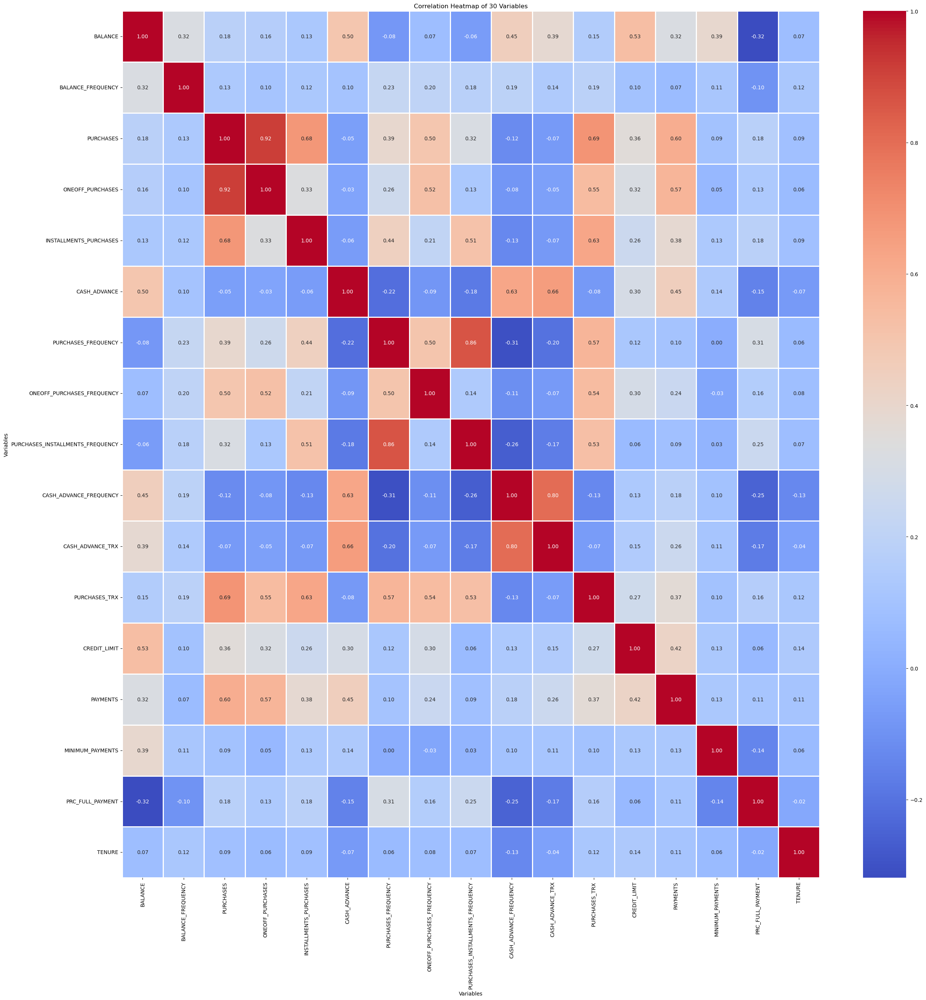

In [143]:
FtrSlct(data);

In [145]:
import pandas as pd
import numpy as np

def drop_highly_correlated(data, threshold=0.8):
    """
    Drop columns from a DataFrame based on high correlation between columns.
    
    Parameters:
    - df: DataFrame
    - threshold: Correlation threshold to identify highly correlated columns (default=0.8)
    
    Returns:
    - DataFrame with highly correlated columns removed
    """
    # Step 1: Calculate the correlation matrix
    corr_matrix = data.corr().abs()
    
    # Step 2: Identify columns to drop (those with correlations above the threshold)
    upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    
    # Step 3: Find index of columns with correlation greater than the threshold
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > threshold)]
    
    print(f"Columns to drop: {to_drop}")
    
    # Step 4: Drop the highly correlated columns
    df_reduced = data.drop(columns=to_drop)
    
    return df_reduced

# Example usage:
correlated_columns = drop_highly_correlated(data, threshold=0.85)


Columns to drop: ['ONEOFF_PURCHASES', 'PURCHASES_INSTALLMENTS_FREQUENCY']


In [147]:
data= data.drop(columns=['ONEOFF_PURCHASES', 'PURCHASES_INSTALLMENTS_FREQUENCY'])


In [149]:
data = remove_outliers_iqr(data)


#For Single Linkage

#Before selecting any method for clustering visualization

For Visualization in High dimensionality to what is happing is in the individual clusters

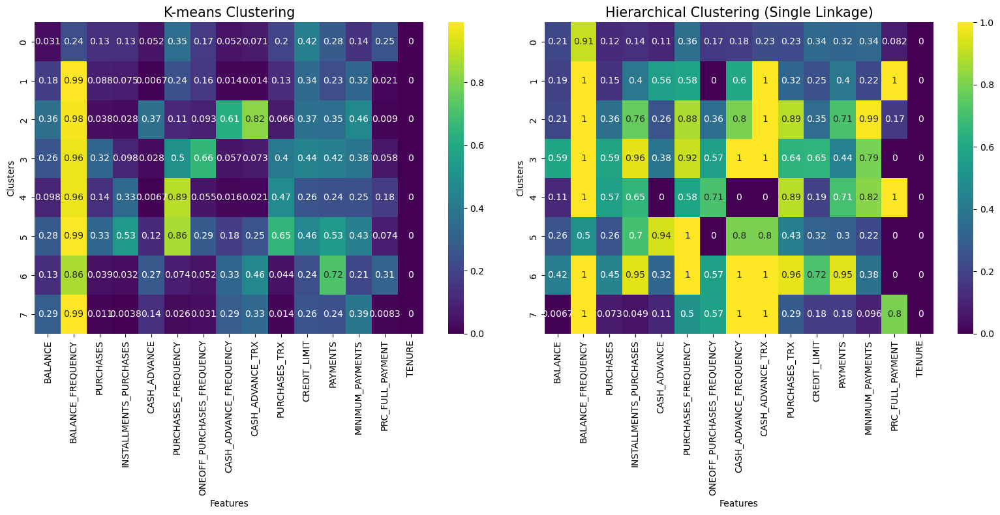

In [151]:
HeatmapFeatureMeans(data, n_clusters=8, linkage_type='single')


Interpretations are not clear because of the too many clusters. 

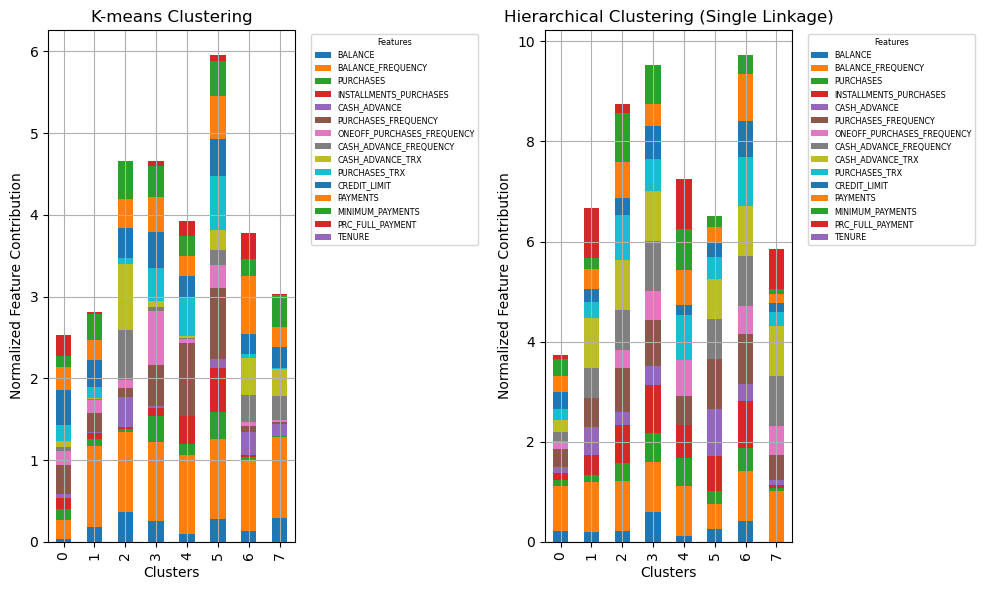

In [153]:
StackedBarPlotFeatureContributions(data, n_clusters=8, linkage_type='single')


Interpretations are not clear because of the too many clusters. 

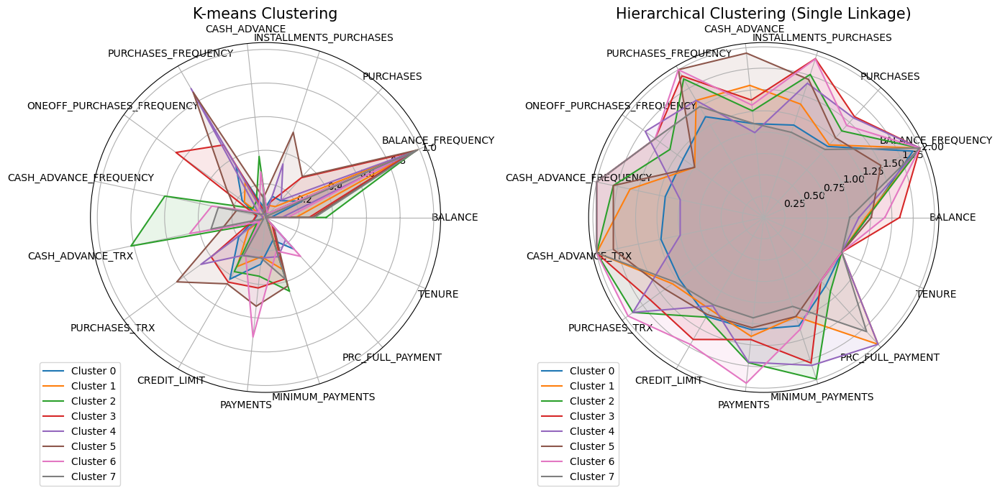

In [155]:
RadialChartFeatureMeans(data, n_clusters=8, linkage_type='single')


Interpretations are not clear because of the too many clusters. 

With Dimensionality reduction

PCA

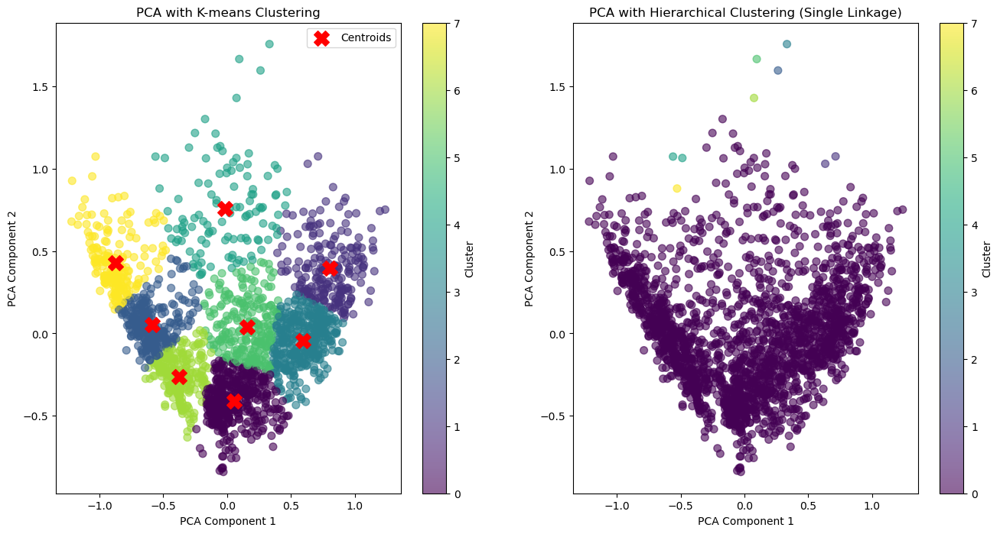

In [157]:
PCA_with_KMeans_and_Hierarchical(data, n_clusters=8, linkage_type='single')


Interpretations are not clear because of the too many clusters. 

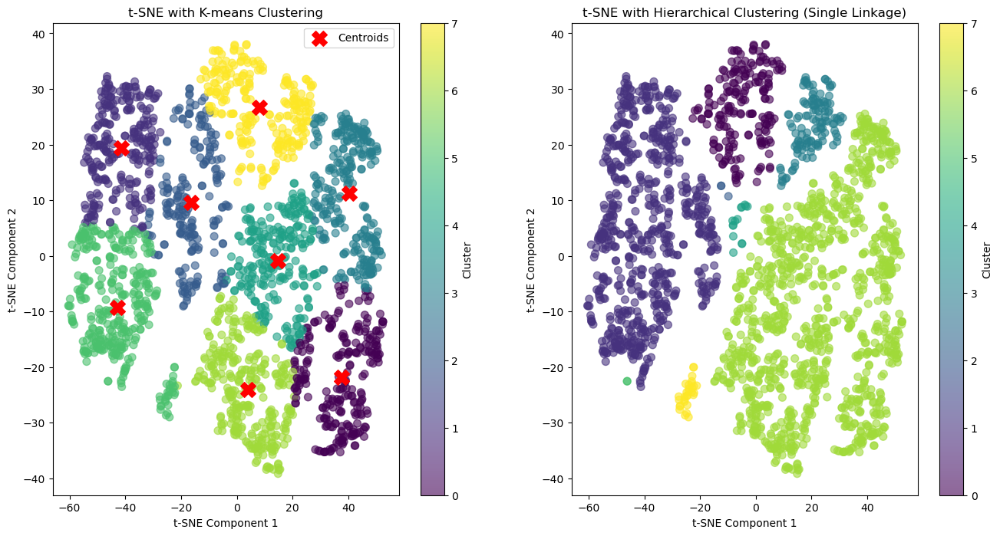

In [159]:
tSNE_with_KMeans_and_Hierarchical(data, n_clusters=8, linkage_type='single')

Interpretations are not clear because of the too many clusters. 

Choosing the best number of clusters

Dendogram wrt data points

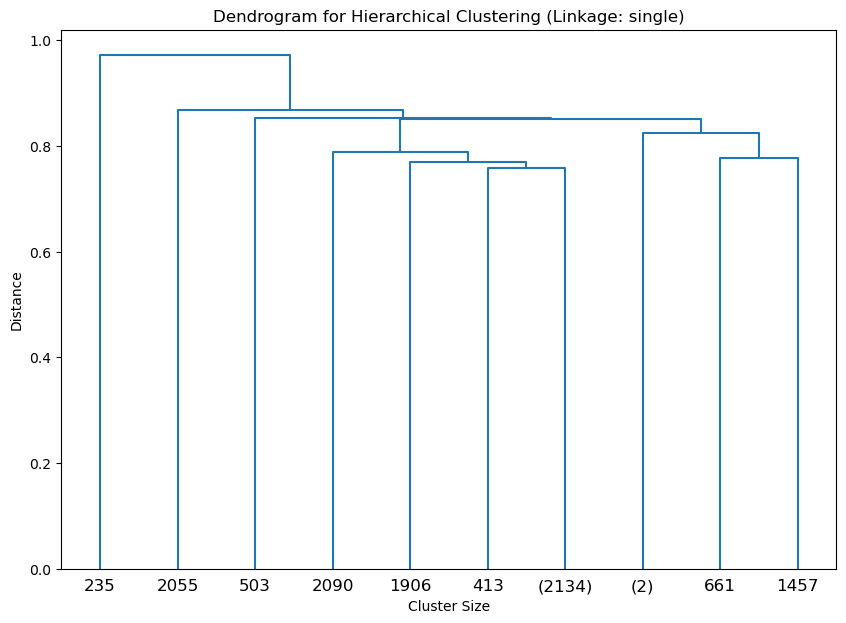

In [161]:
ClusterFun(data, linkage_method='single')  # You can change the linkage method here.


2 clusters from above dendogram

Dendogram wrt to features

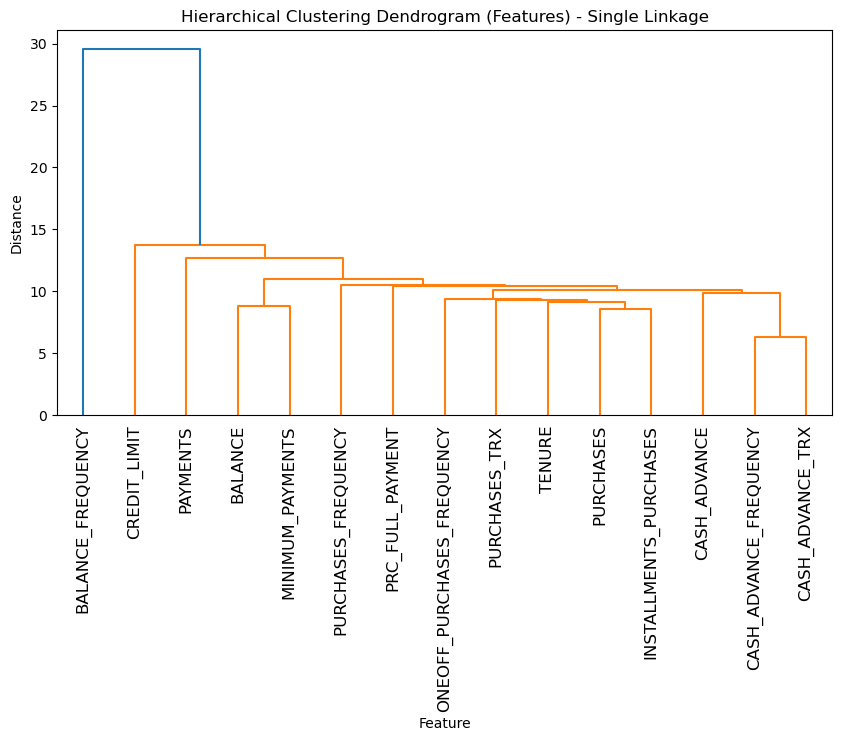

In [163]:
feature_clustering_dendrogram(data, linkage_type='single')

2 clusters from from the above dendogram

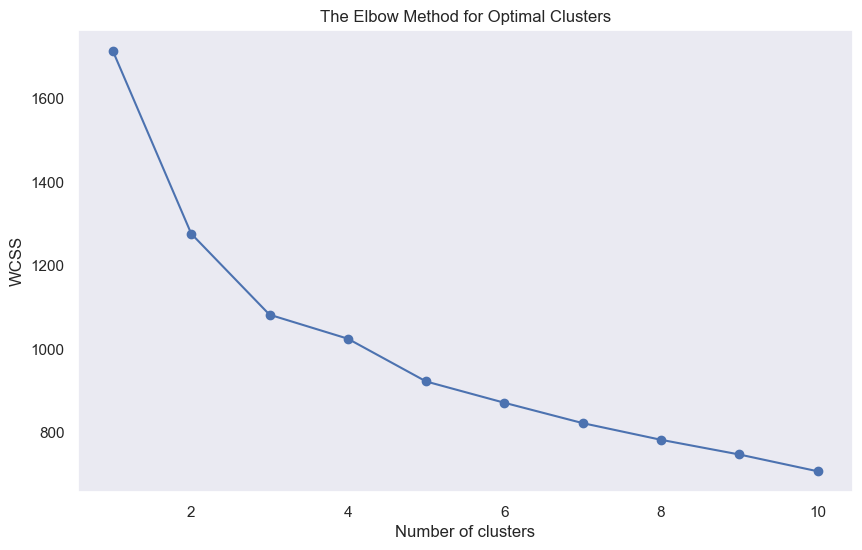

In [165]:
# Assume `data` is your 2D data structure (e.g., numpy array or DataFrame)
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='sklearn.cluster._kmeans')
wcss = calculate_wcss(data)

# Plotting the elbow graph
plt.figure(figsize=(10, 6))
sns.set()
plt.plot(range(1, 11), wcss, marker='o')
plt.title('The Elbow Method for Optimal Clusters')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid()
plt.show()


2 clusters from above elbow curve method

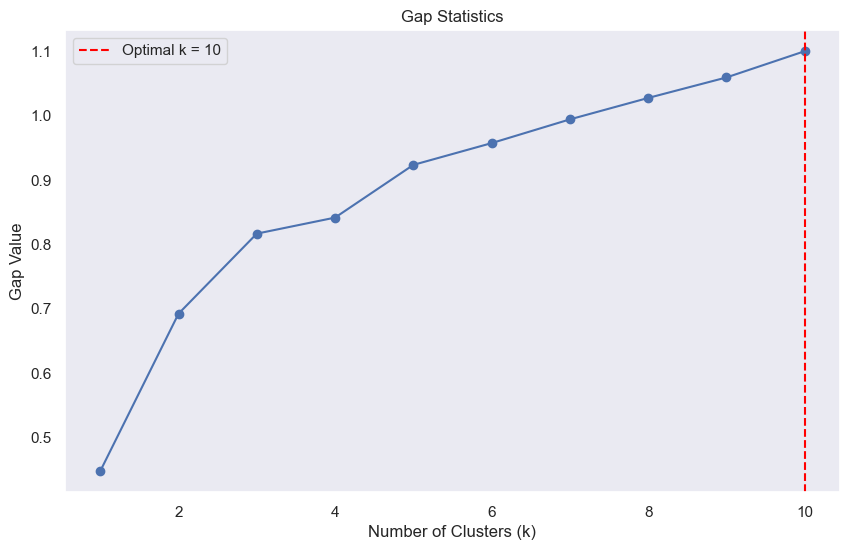

The optimal number of clusters is: 10


In [167]:
import matplotlib.pyplot as plt

# Assume `data` is your dataset (e.g., a 2D NumPy array or DataFrame)
gap_values, optimal_k = gap_statistics(data)

# Plotting the Gap Statistics
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(gap_values) + 1), gap_values, marker='o')
plt.title('Gap Statistics')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Gap Value')
plt.axvline(x=optimal_k, color='red', linestyle='--', label=f'Optimal k = {optimal_k}')
plt.legend()
plt.grid()
plt.show()

print(f'The optimal number of clusters is: {optimal_k}')


Cluster Numbers: [2, 3, 4, 5]
K-means Silhouette Scores: [0.33113693080716455, 0.3361764636772505, 0.3114261332686553, 0.32501552979548487]
Hierarchical Silhouette Scores: [0.5246337442130014, 0.37843940408350174, 0.3365408408558595, 0.3361981162311901]


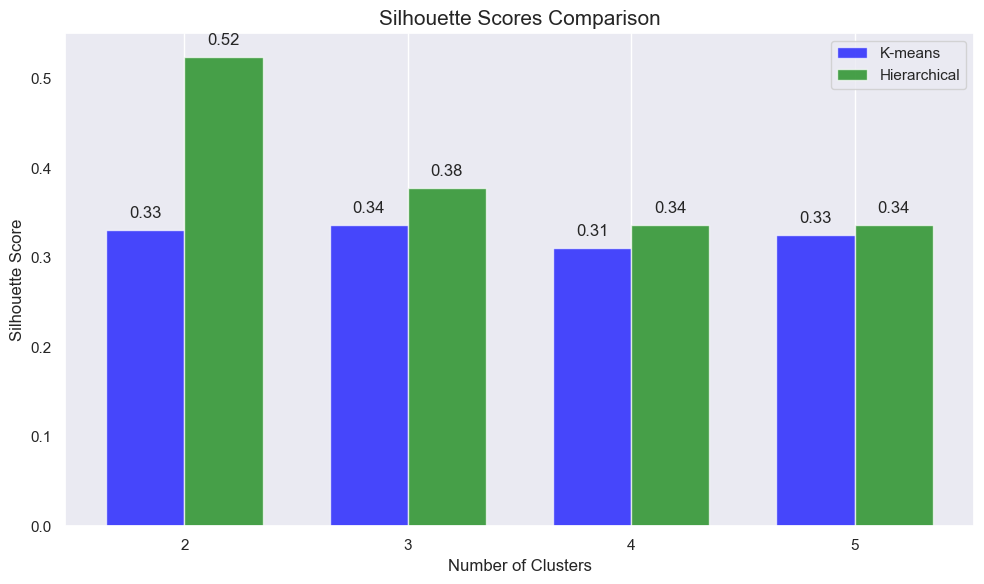

In [129]:
calculate_silhouette_scores(data, cluster_nums= [2, 3, 4, 5], linkage_type='single')


3 clusters from the above silhoute score

Cluster Numbers: [2, 3, 4, 5]
K-means Davies-Bouldin Index: [1.6196704665723185, 1.624517131641311, 1.6727619309003394, 1.5706993708724908]
Hierarchical Davies-Bouldin Index (single linkage): [0.5855414848812203, 0.5738869408759376, 0.561903969709371, 0.650562683908239]


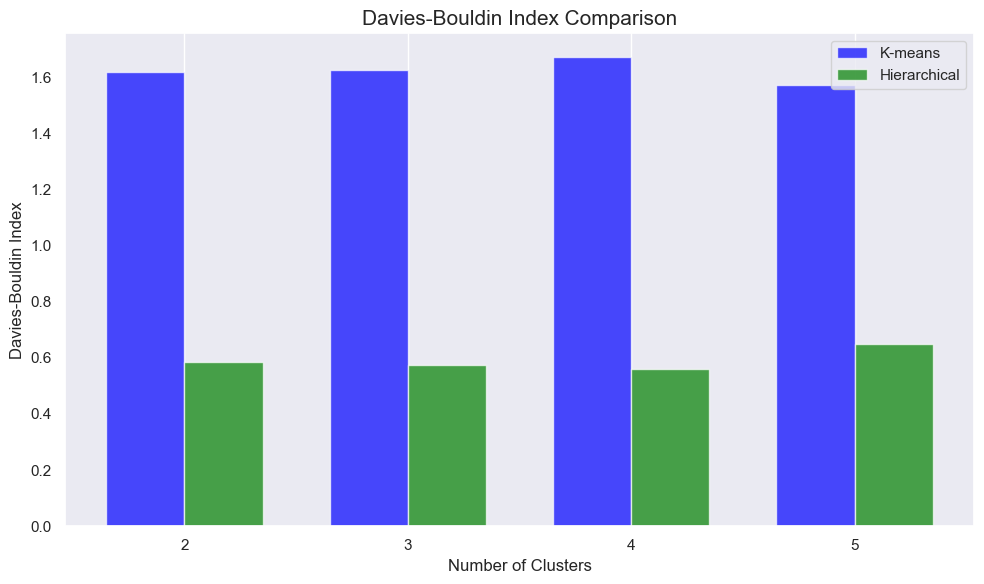

In [168]:
calculate_davies_bouldin_index(data, cluster_nums=[2, 3, 4, 5], linkage_type='single')


In [ ]:
2 clusters from the above DB index

Post Clustering approach

So we will do our working with 2 clusters as most of the above clusters are in 2 clusters. 

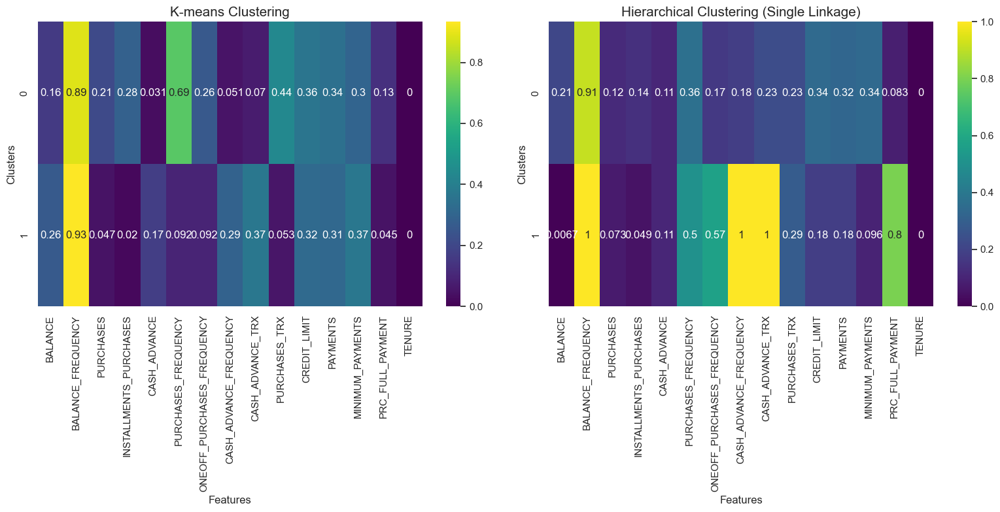

In [171]:
HeatmapFeatureMeans(data, n_clusters=2, linkage_type='single')


In K means high spending customers are segreated in 0 cluster and low spending clusters in 1 and it is viceversa in Hierarchical clusters major segreation can be interprated through TENURE and Balance frequency

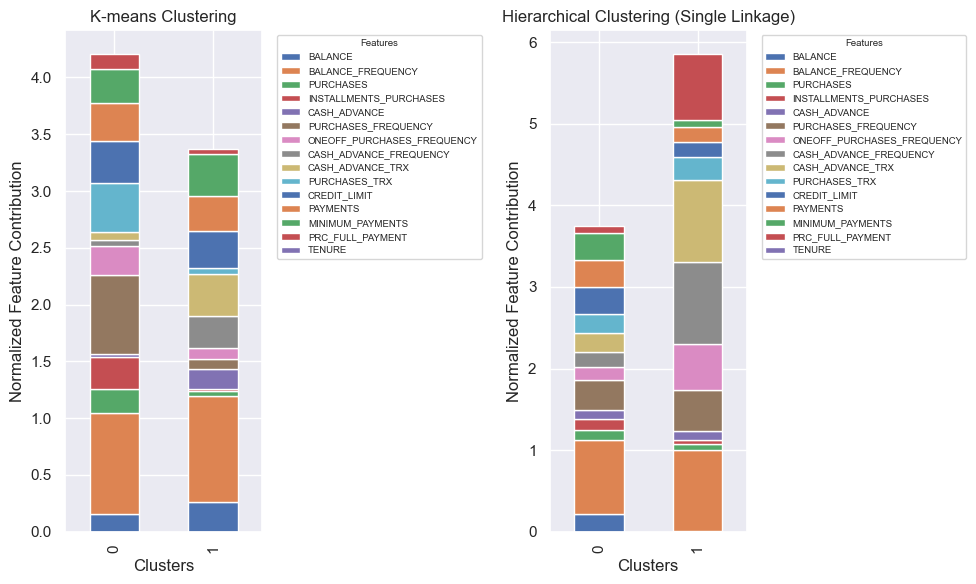

In [173]:
StackedBarPlotFeatureContributions(data, n_clusters=2, linkage_type='single')

In K means high spending customers are segreated in 0 cluster and low spending clusters in 1 and it is viceversa in Hierarchical clusters major segreation can be interprated through TENURE and Balance frequency

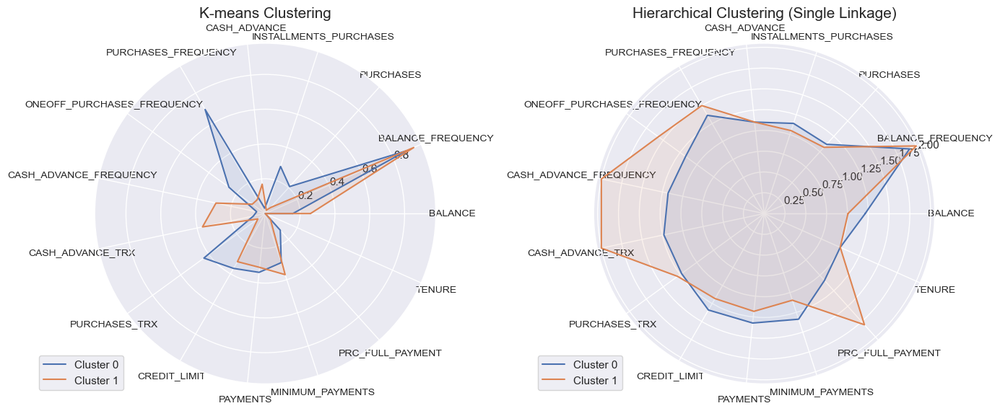

In [175]:
RadialChartFeatureMeans(data, n_clusters=2, linkage_type='single')


In K means high spending customers are segreated in 0 cluster and low spending clusters in 1 and it is viceversa in Hierarchical clusters major segreation can be interprated through TENURE and Balance frequency

With dimensionality reduction

PCA

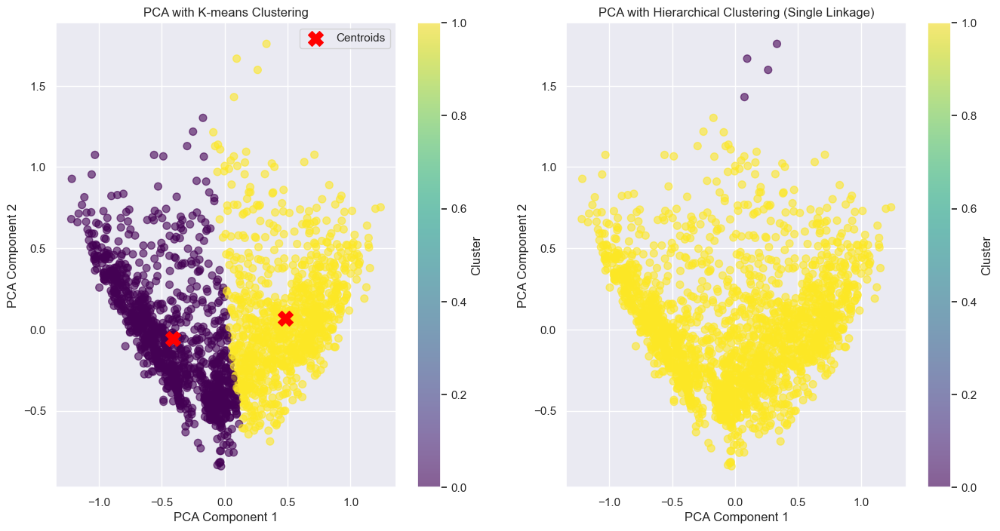

In [177]:
PCA_with_KMeans_and_Hierarchical(data, n_clusters=2, linkage_type='single')

In PCA proper clusters are created for K means but for hierarchical clustering clusters are not created properly and outlier is observed

TSNE

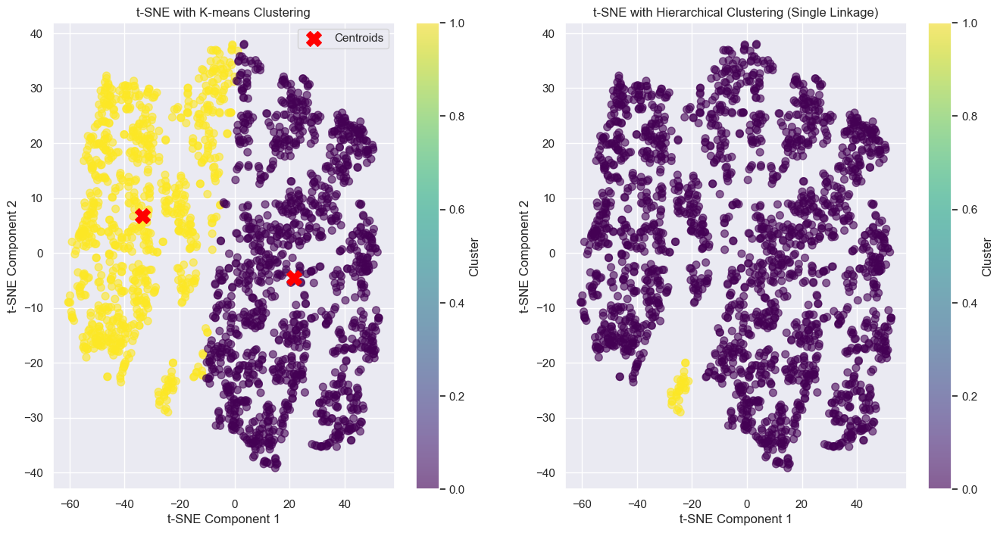

In [179]:
tSNE_with_KMeans_and_Hierarchical(data, n_clusters=2, linkage_type='single')

In TSNE clusters are created better for PCA but in TSNE  for hierarchical major data is occupied in purple clustering which is showing most of the data has been captured by one set of groups only

For Complete Linkage

Before selecting any method for clustering visualization

For Visualization in High dimensionality to what is happing is in the individual clusters

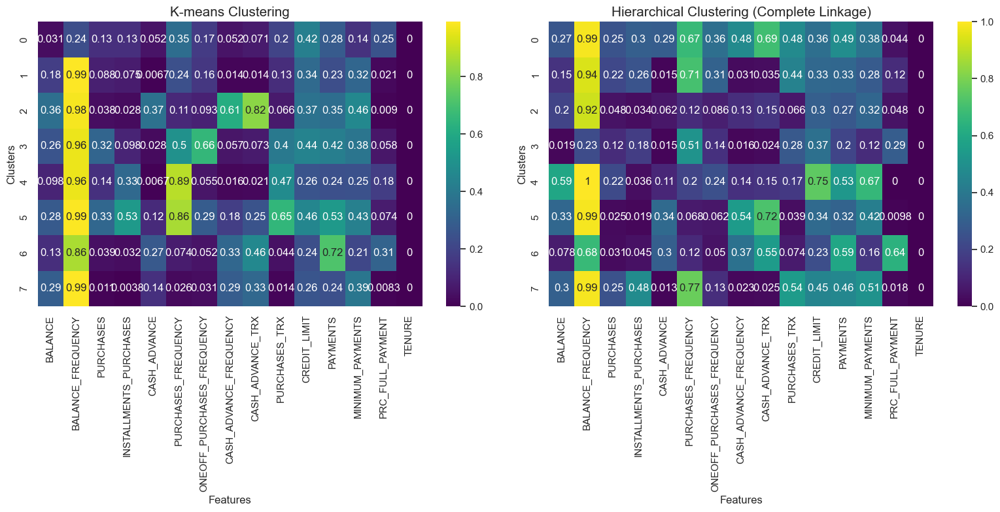

In [181]:
HeatmapFeatureMeans(data, n_clusters=8, linkage_type='complete')


Because of too many clusters business insight is difficult to extract from this graph

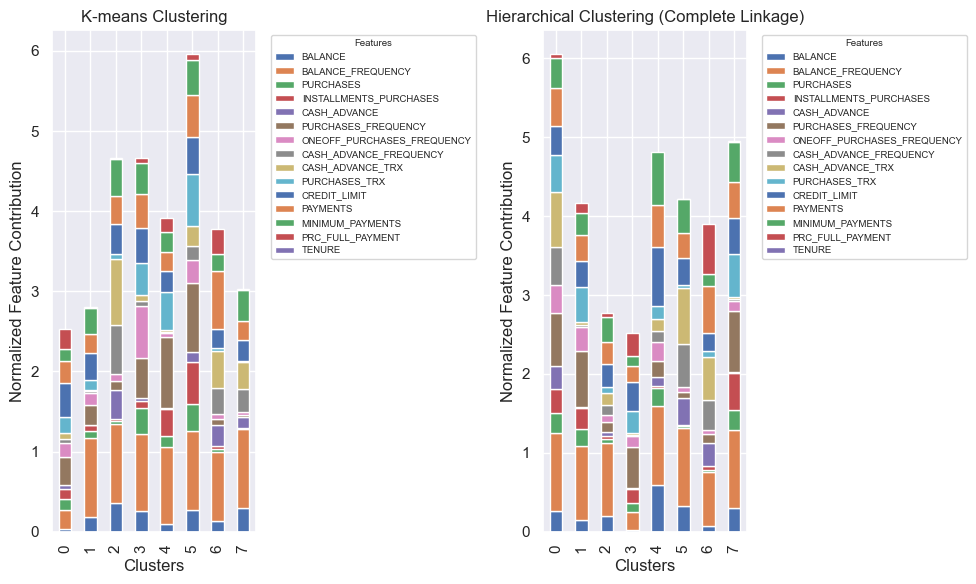

In [183]:
StackedBarPlotFeatureContributions(data, n_clusters=8, linkage_type='complete')

In [ ]:
Because of too many clusters business insight is difficult to extract from this graph

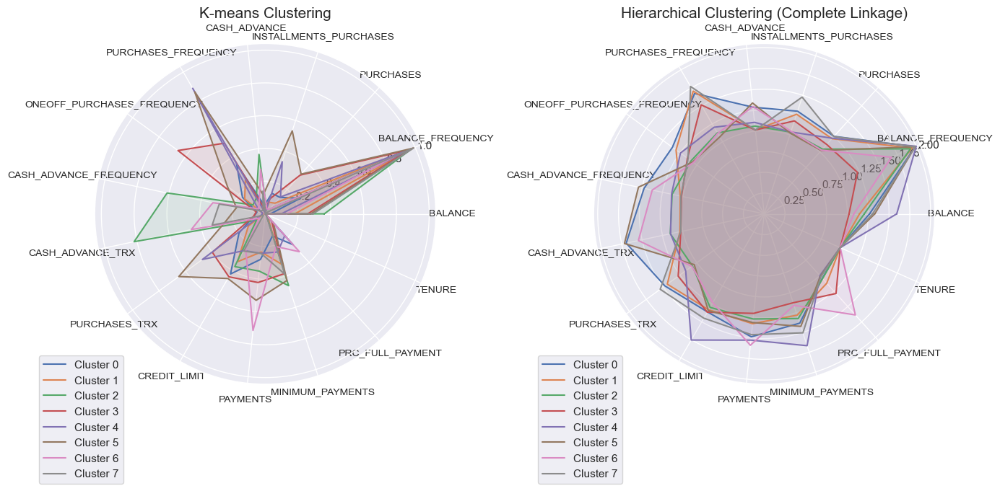

In [185]:
RadialChartFeatureMeans(data, n_clusters=8, linkage_type='complete')


Because of too many clusters business insight is difficult to extract from this graph

With Dimensionality reduction

PCA

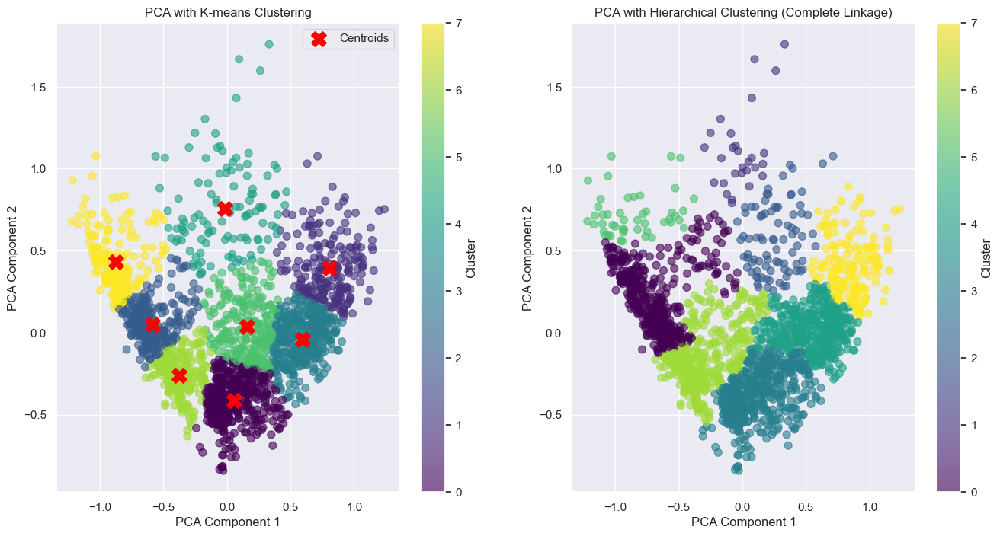

In [189]:
PCA_with_KMeans_and_Hierarchical(data, n_clusters=8, linkage_type='complete')


In [ ]:
Because of too many clusters business insight is difficult to extract from this graph but proper clusters are created as compared to the Single linkage

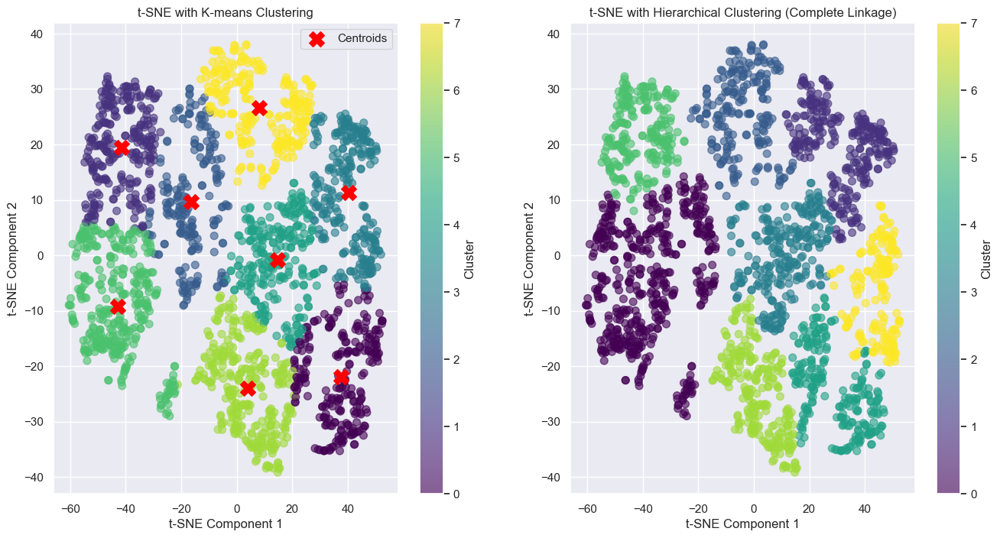

In [191]:
tSNE_with_KMeans_and_Hierarchical(data, n_clusters=8, linkage_type='complete')

In [ ]:
Because of too many clusters business insight is difficult to extract from this graph but proper clusters are created as compared to the Single linkage

Choosing the best number of clusters

Dendogram wrt data points

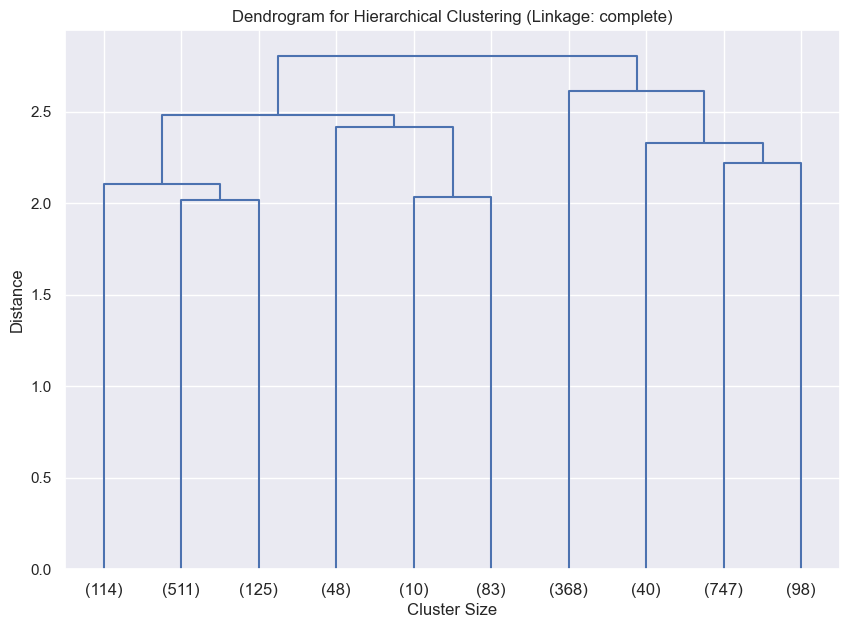

In [193]:
ClusterFun(data, linkage_method='complete')  # You can change the linkage method here.


In [ ]:
3 clusters are created from above dendogram

Dendogram wrt to features

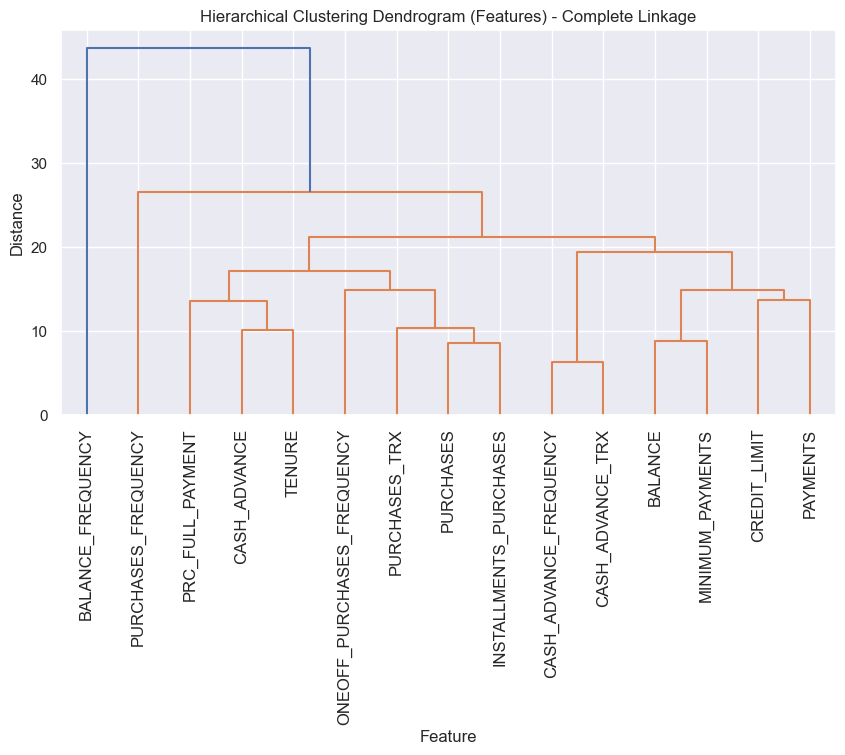

In [195]:
feature_clustering_dendrogram(data, linkage_type='complete')

3 clusters are selected based on the above dendogram

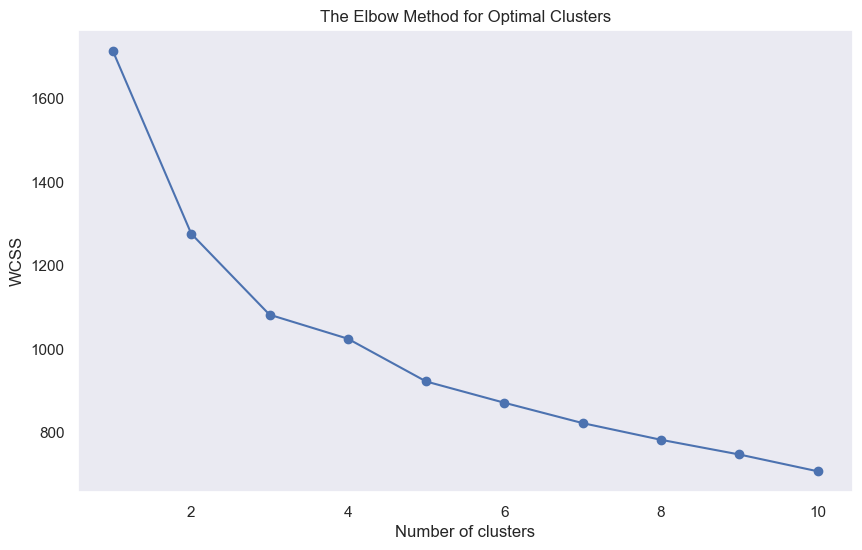

In [197]:
# Assume `data` is your 2D data structure (e.g., numpy array or DataFrame)
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='sklearn.cluster._kmeans')
wcss = calculate_wcss(data)

# Plotting the elbow graph
plt.figure(figsize=(10, 6))
sns.set()
plt.plot(range(1, 11), wcss, marker='o')
plt.title('The Elbow Method for Optimal Clusters')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid()
plt.show()


In [ ]:
2 clusters are selected based on the above elbow curve

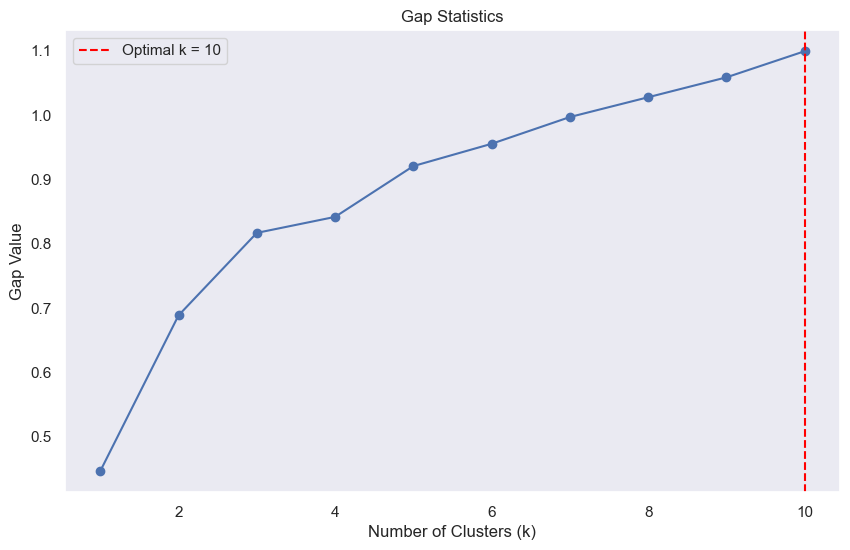

The optimal number of clusters is: 10


In [199]:
import matplotlib.pyplot as plt

# Assume `data` is your dataset (e.g., a 2D NumPy array or DataFrame)
gap_values, optimal_k = gap_statistics(data)

# Plotting the Gap Statistics
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(gap_values) + 1), gap_values, marker='o')
plt.title('Gap Statistics')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Gap Value')
plt.axvline(x=optimal_k, color='red', linestyle='--', label=f'Optimal k = {optimal_k}')
plt.legend()
plt.grid()
plt.show()

print(f'The optimal number of clusters is: {optimal_k}')


Cluster Numbers: [2, 3, 4, 5]
K-means Silhouette Scores: [0.33113693080716455, 0.3361764636772505, 0.3114261332686553, 0.32501552979548487]
Hierarchical Silhouette Scores: [0.29473218754758823, 0.19881689922508955, 0.22752373973961476, 0.2238038128122336]


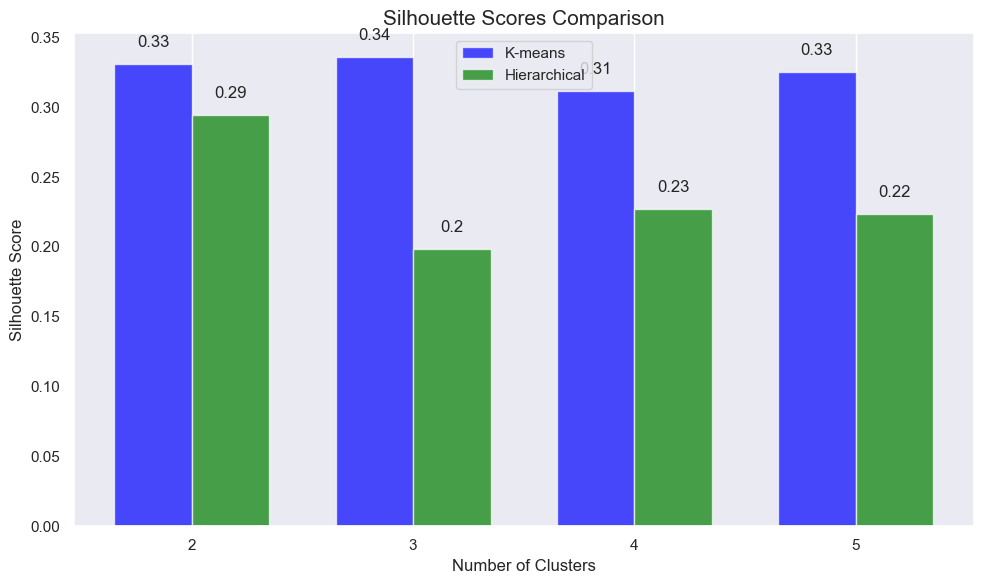

In [167]:
calculate_silhouette_scores(data, cluster_nums= [2, 3, 4, 5], linkage_type='complete')


2 clusters are selected from the above graph

Cluster Numbers: [2, 3, 4, 5]
K-means Davies-Bouldin Index: [1.2890752233569338, 1.328341227772501, 1.202984068283894, 1.1950642346098221]
Hierarchical Davies-Bouldin Index (complete linkage): [1.297918349675895, 1.8122307784961393, 1.5344900208632386, 1.481460824453222]


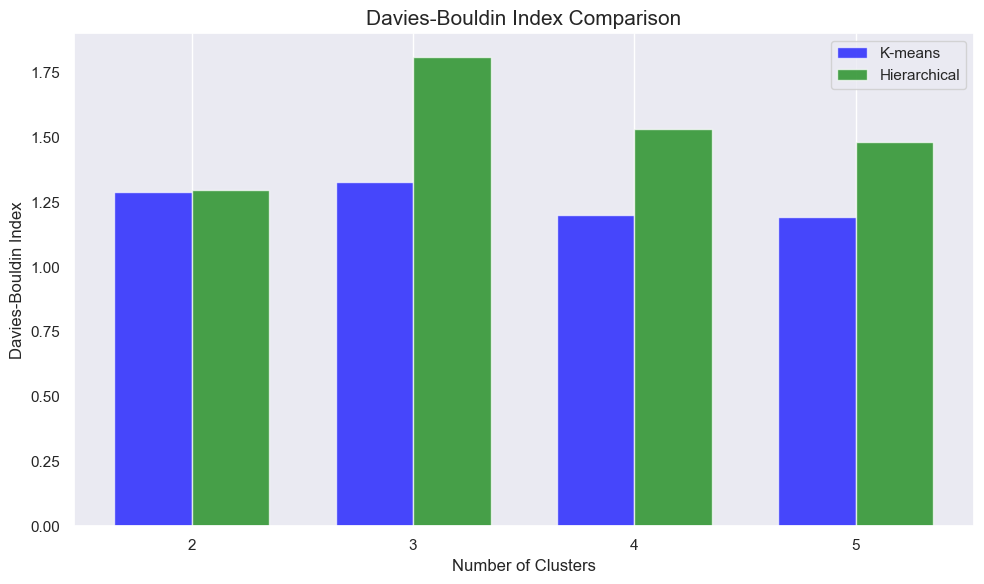

In [169]:
calculate_davies_bouldin_index(data, cluster_nums=[2, 3, 4, 5], linkage_type='complete')


In [ ]:
2 clusters are selected from the above graph

Consider 2 clusters based on the above metrix as most of the metrics are suggesting 2

Post Clustering approach

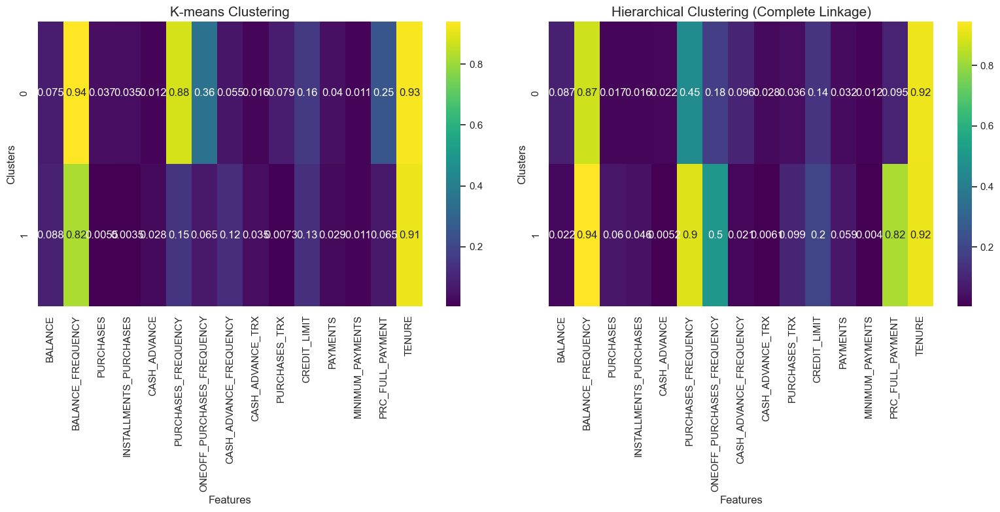

In [171]:
HeatmapFeatureMeans(data, n_clusters=2, linkage_type='complete')


In K means high spending customers are segreated in 0 cluster and low spending clusters in 1 and it is viceversa in Hierarchical clusters major segreation can be interprated through TENURE and Balance frequency

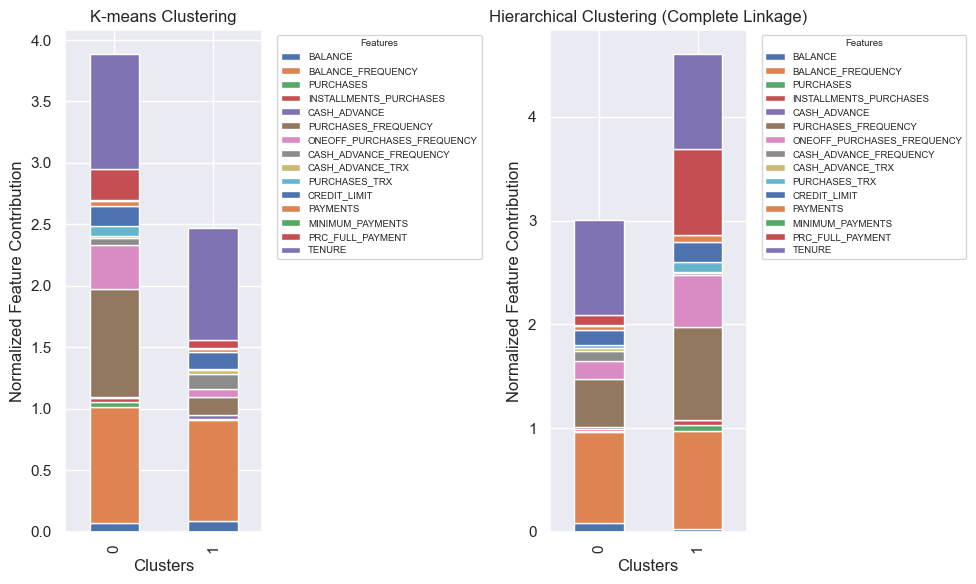

In [173]:
StackedBarPlotFeatureContributions(data, n_clusters=2, linkage_type='complete')

In K means high spending customers are segreated in 0 cluster and low spending clusters in 1 and it is viceversa in Hierarchical clusters major segreation can be interprated through TENURE and Balance frequency

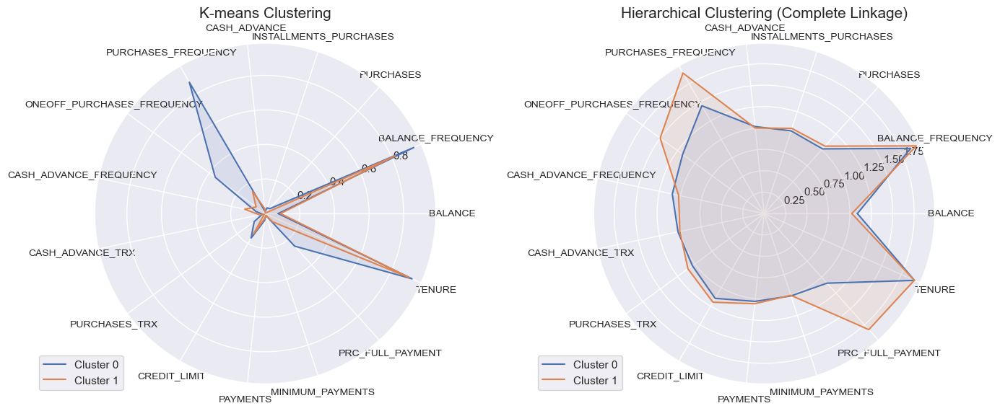

In [175]:
RadialChartFeatureMeans(data, n_clusters=2, linkage_type='complete')


In K means high spending customers are segreated in 0 cluster and low spending clusters in 1 and it is viceversa in Hierarchical clusters major segreation can be interprated through TENURE and Balance frequency

With dimensionality reduction

PCA

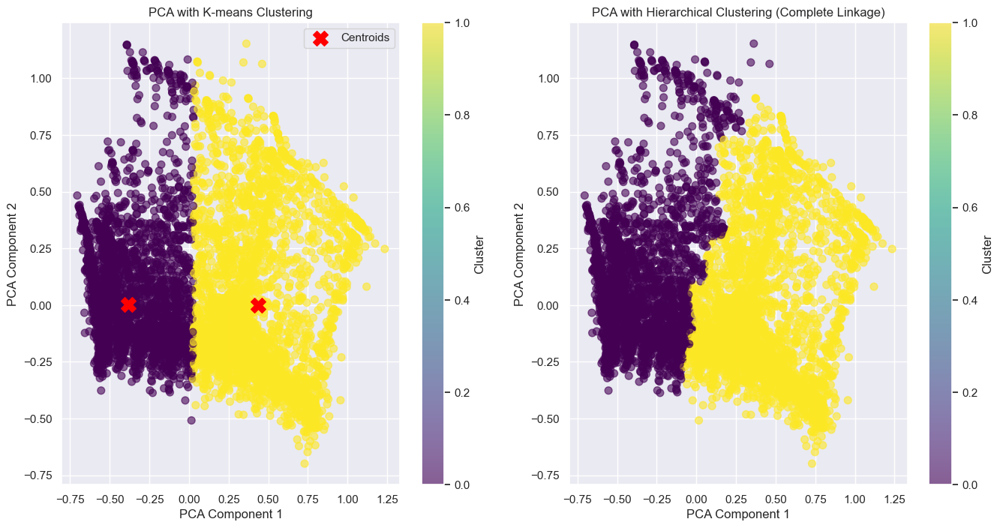

In [177]:
PCA_with_KMeans_and_Hierarchical(data, n_clusters=2, linkage_type='complete')

PCA is properly done and two clusters can be distinguished 

TSNE

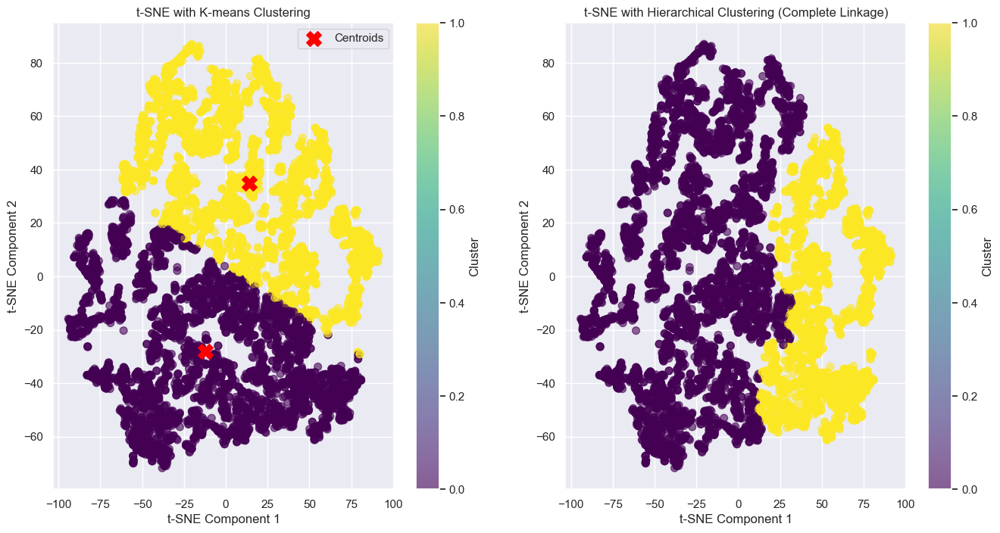

In [179]:
tSNE_with_KMeans_and_Hierarchical(data, n_clusters=2, linkage_type='complete')

Proper clustering can be showing in above TSNE and hierarchical clustering is better for hierarchical better than the TSNE clustering for the single linkage clustering

#Average linkage

#Before selecting any method for clustering visualization

For Visualization in High dimensionality to what is happing is in the individual clusters

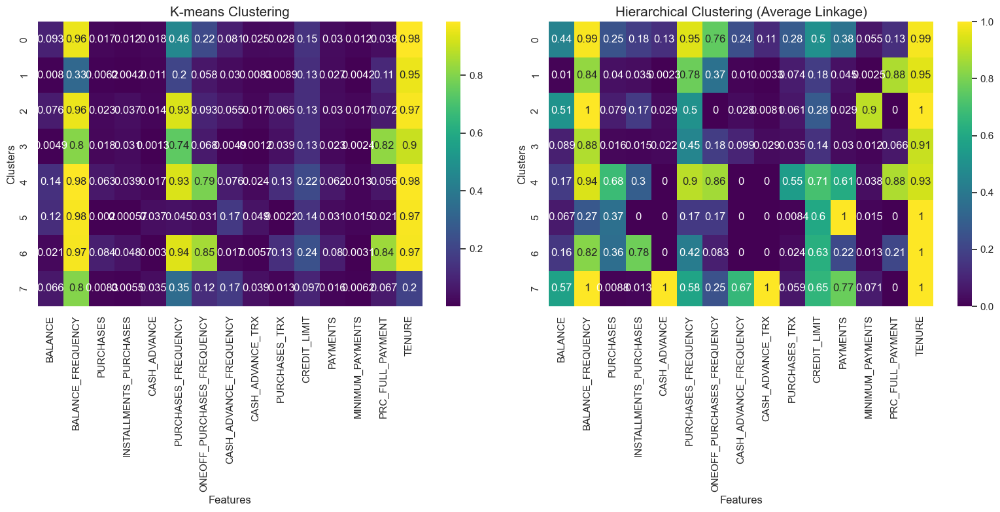

In [199]:
HeatmapFeatureMeans(data, n_clusters=8, linkage_type='average')


Because of too many clusters business insight is difficult to extract from this graph

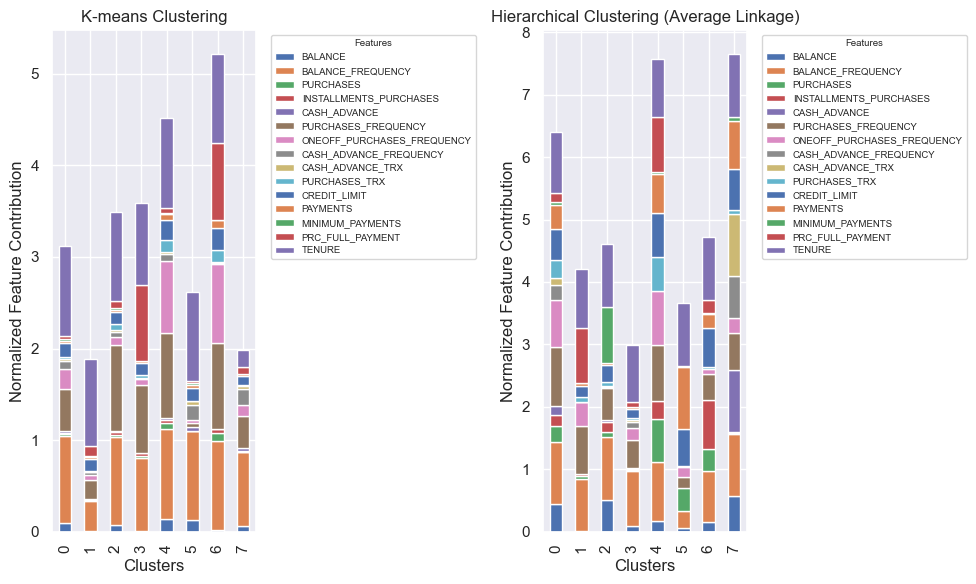

In [201]:
StackedBarPlotFeatureContributions(data, n_clusters=8, linkage_type='average')


Because of too many clusters business insight is difficult to extract from this graph

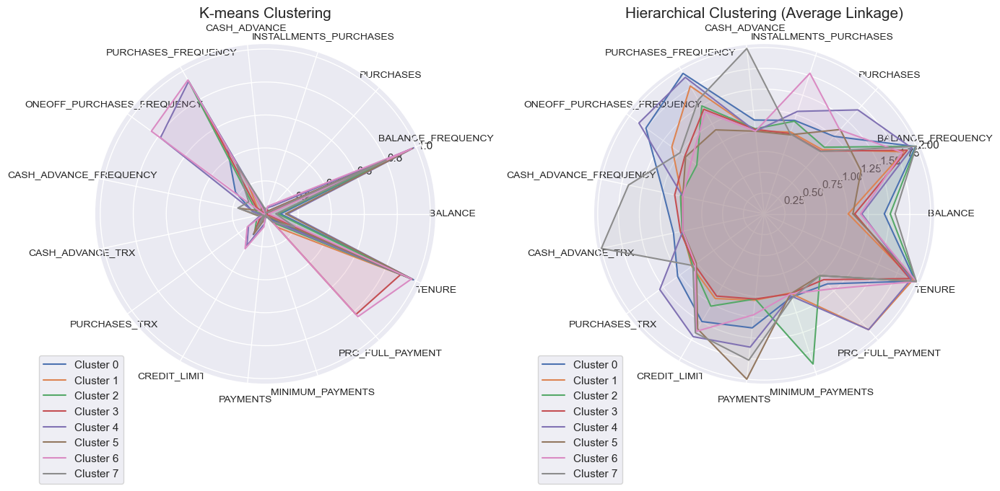

In [203]:
RadialChartFeatureMeans(data, n_clusters=8, linkage_type='average')


Because of too many clusters business insight is difficult to extract from this graph

With Dimensionality reduction

PCA

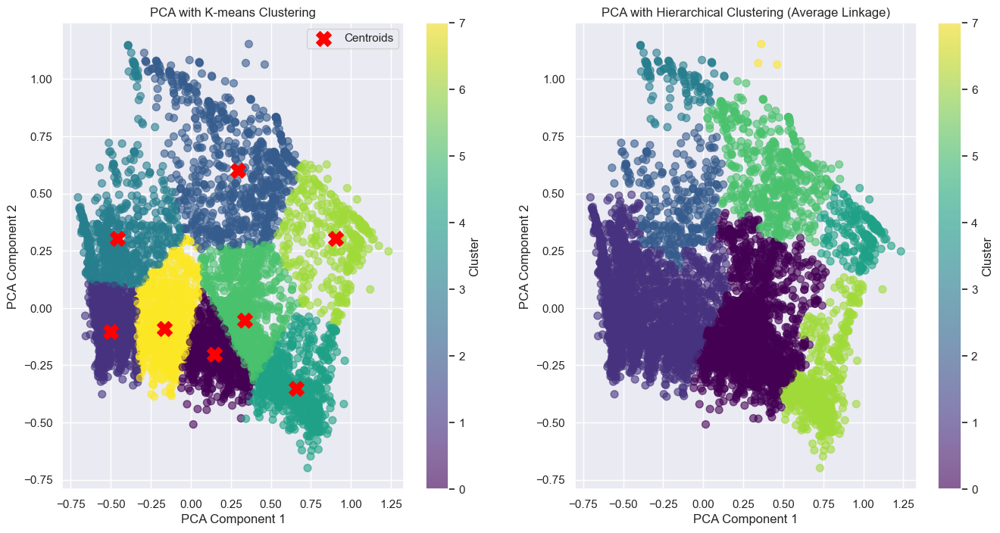

In [205]:
PCA_with_KMeans_and_Hierarchical(data, n_clusters=8, linkage_type='average')


In [ ]:
Because of too many clusters business insight is difficult to extract from this graph

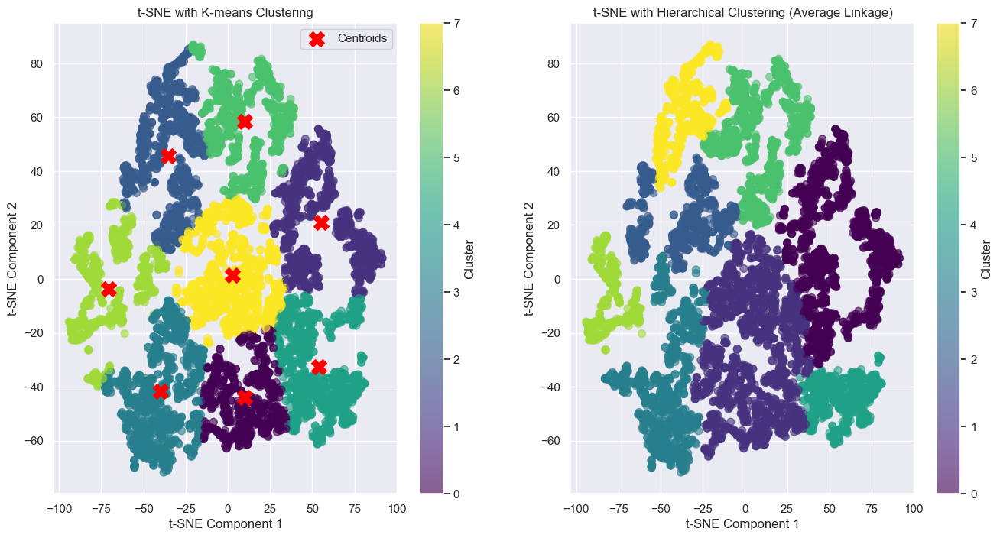

In [207]:
tSNE_with_KMeans_and_Hierarchical(data, n_clusters=8, linkage_type='average')

In [ ]:
Because of too many clusters business insight is difficult to extract from this graph

Choosing the best number of clusters

Dendogram wrt data points

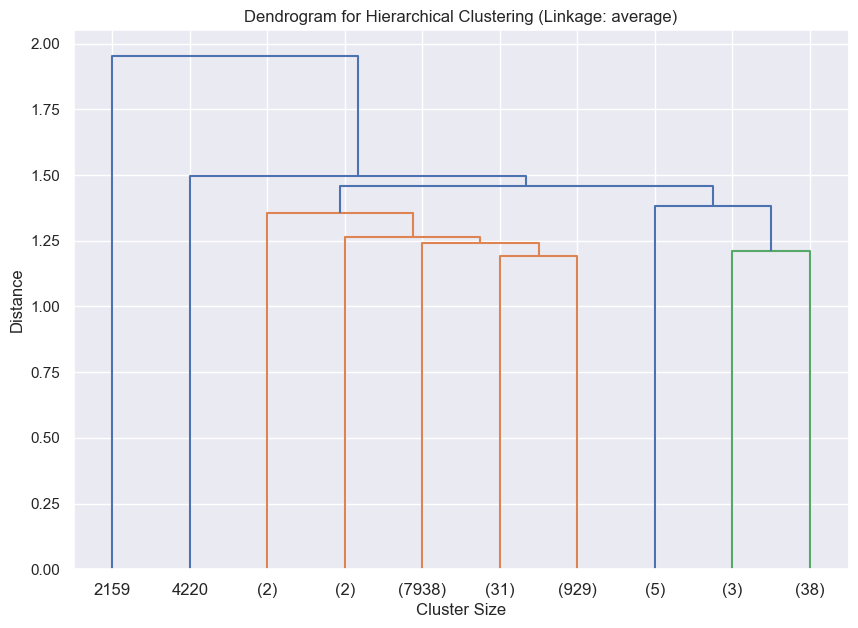

In [209]:
ClusterFun(data, linkage_method='average')  # You can change the linkage method here.


In [ ]:
3 clusters are selected from above 

Dendogram wrt to features

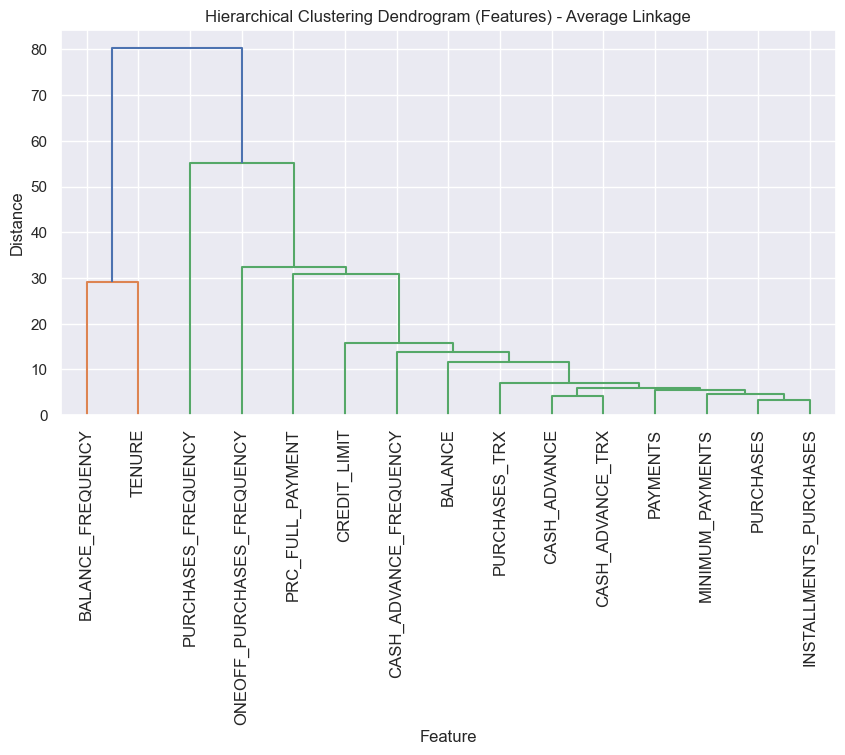

In [211]:
feature_clustering_dendrogram(data, linkage_type='average')

In [ ]:
3 clusters are selected from above 

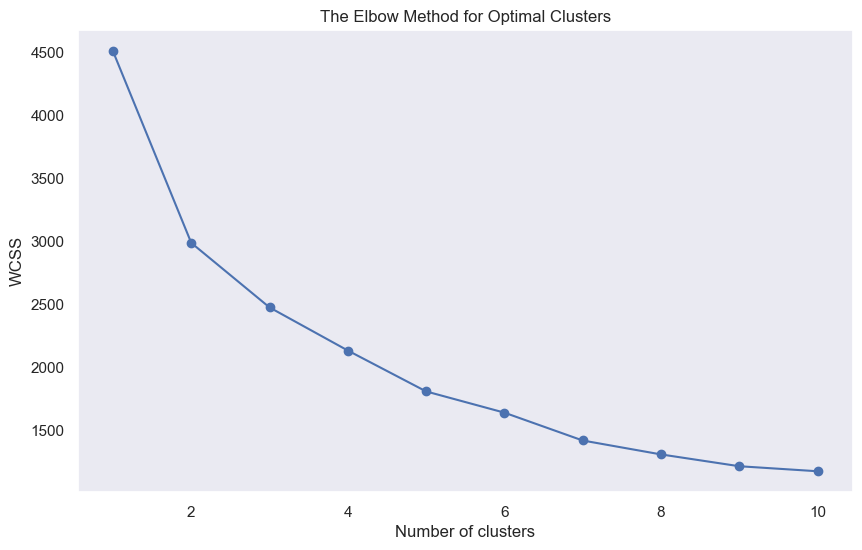

In [213]:
# Assume `data` is your 2D data structure (e.g., numpy array or DataFrame)
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='sklearn.cluster._kmeans')
wcss = calculate_wcss(data)

# Plotting the elbow graph
plt.figure(figsize=(10, 6))
sns.set()
plt.plot(range(1, 11), wcss, marker='o')
plt.title('The Elbow Method for Optimal Clusters')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid()
plt.show()


In [ ]:
2 clusters are selected from the abvoe graph 

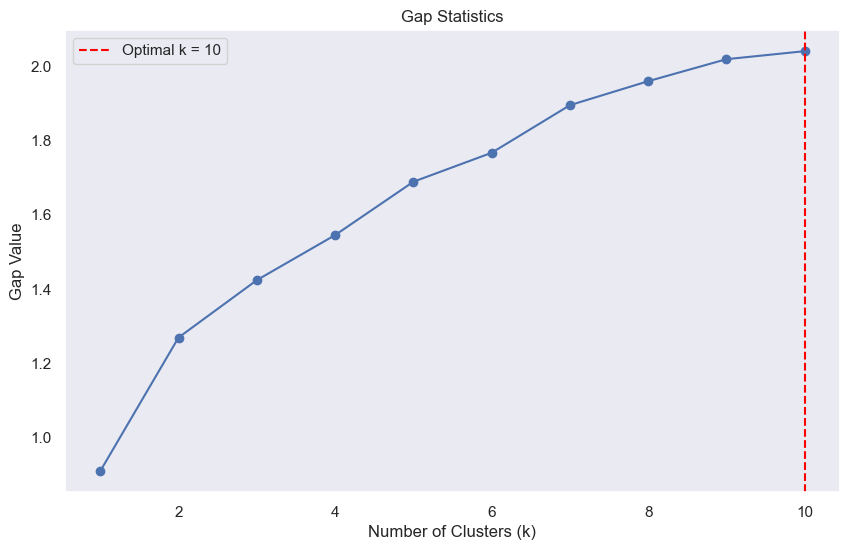

The optimal number of clusters is: 10


In [215]:
import matplotlib.pyplot as plt

# Assume `data` is your dataset (e.g., a 2D NumPy array or DataFrame)
gap_values, optimal_k = gap_statistics(data)

# Plotting the Gap Statistics
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(gap_values) + 1), gap_values, marker='o')
plt.title('Gap Statistics')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Gap Value')
plt.axvline(x=optimal_k, color='red', linestyle='--', label=f'Optimal k = {optimal_k}')
plt.legend()
plt.grid()
plt.show()

print(f'The optimal number of clusters is: {optimal_k}')


Cluster Numbers: [2, 3, 4, 5]
K-means Silhouette Scores: [0.33113693080716455, 0.3361764636772505, 0.3114261332686553, 0.32501552979548487]
Hierarchical Silhouette Scores: [0.5246337442130014, 0.3763128981510265, 0.2939680871659254, 0.2782313170792533]


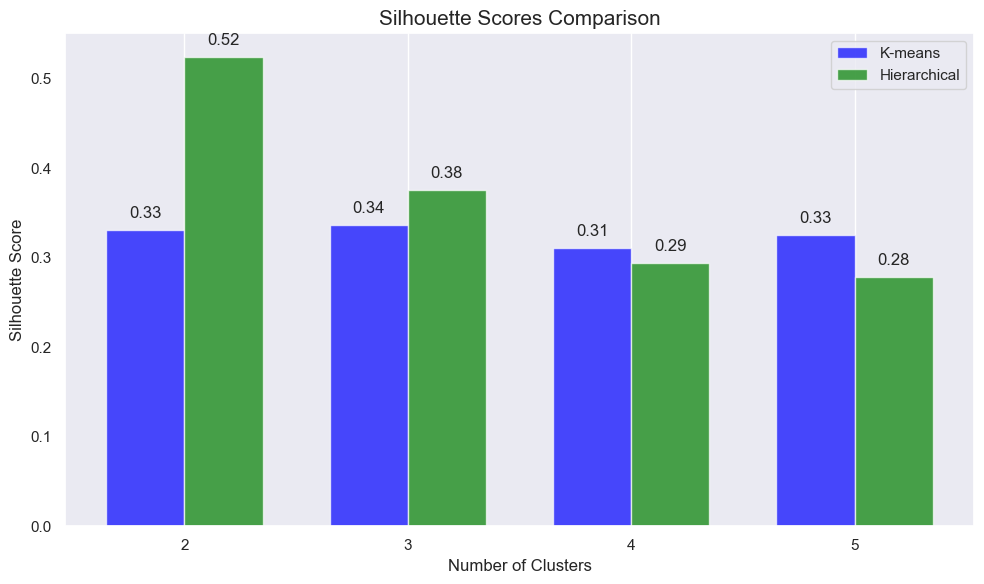

In [221]:
calculate_silhouette_scores(data, cluster_nums= [2, 3, 4, 5], linkage_type='average')


In [ ]:
2 clusters are selected from the above 

Cluster Numbers: [2, 3, 4, 5]
K-means Davies-Bouldin Index: [1.2890752233569338, 1.328341227772501, 1.202984068283894, 1.1950642346098221]
Hierarchical Davies-Bouldin Index (average linkage): [0.36450787134503376, 0.45520161329751785, 0.8873542051309181, 0.9387731652056882]


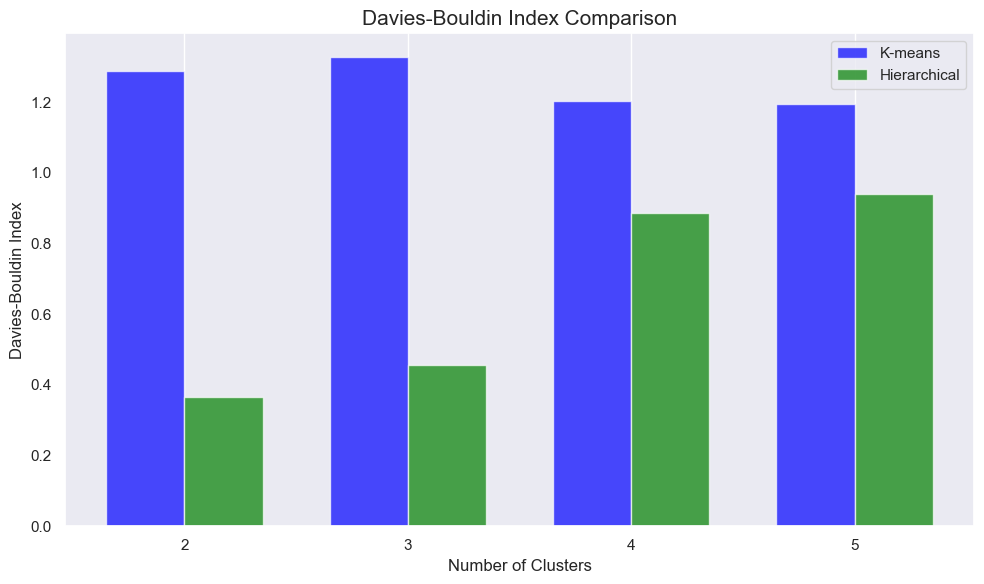

In [219]:
calculate_davies_bouldin_index(data, cluster_nums=[2, 3, 4, 5], linkage_type='average')


In [ ]:
2 clusters are selected from the above 

Post Clustering approach (2 clusters choosed based on the above metrics)

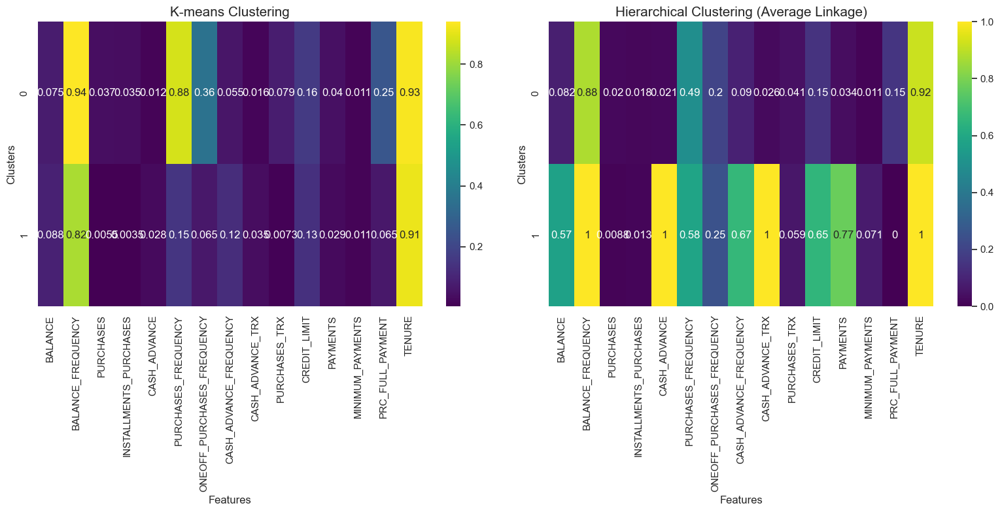

In [225]:
HeatmapFeatureMeans(data, n_clusters=2, linkage_type='average')

In K means high spending customers are segreated in 0 cluster and low spending clusters in 1 and it is viceversa in Hierarchical clusters major segreation can be interprated through TENURE and Balance frequency

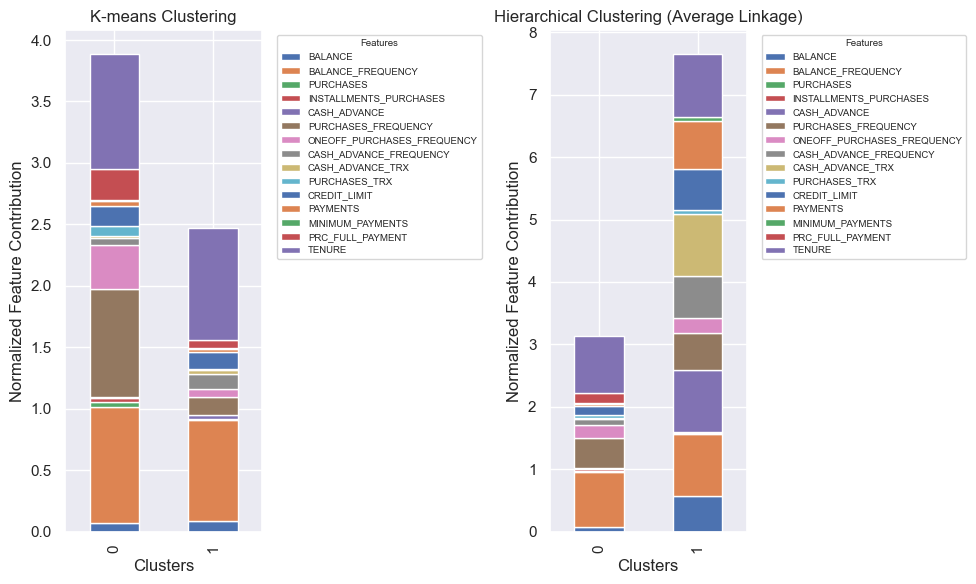

In [227]:
StackedBarPlotFeatureContributions(data, n_clusters=2, linkage_type='average')

In K means high spending customers are segreated in 0 cluster and low spending clusters in 1 and it is viceversa in Hierarchical clusters major segreation can be interprated through TENURE and Balance frequency

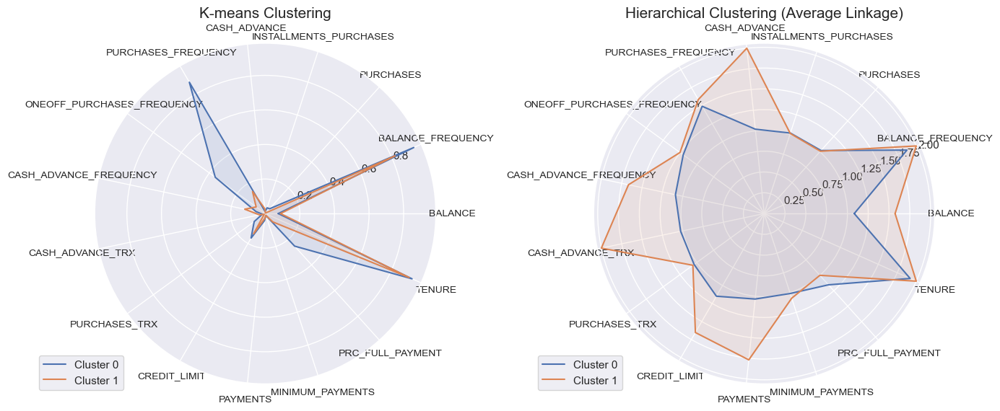

In [229]:
RadialChartFeatureMeans(data, n_clusters=2, linkage_type='average')

In K means high spending customers are segreated in 0 cluster and low spending clusters in 1 and it is viceversa in Hierarchical clusters major segreation can be interprated through TENURE and Balance frequency

With dimensionality reduction

PCA

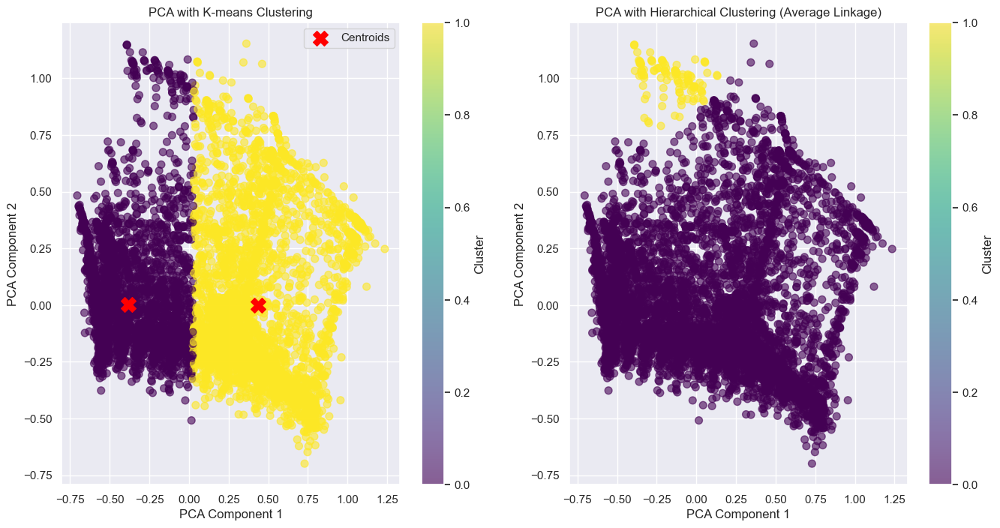

In [231]:
PCA_with_KMeans_and_Hierarchical(data, n_clusters=2, linkage_type='average')

In [ ]:
PCA is not good for Hierarchical clustering

TSNE

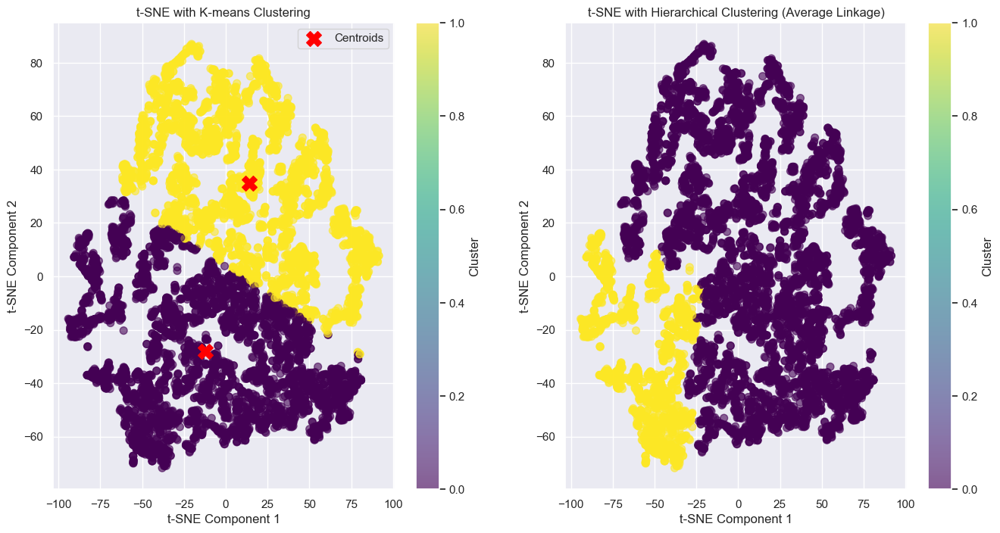

In [233]:
tSNE_with_KMeans_and_Hierarchical(data, n_clusters=2, linkage_type='average')

In [ ]:
Hierarchical clustering for TSNE is properly captured.

Ward Linkage 

Before selecting any method for clustering visualization

For Visualization in High dimensionality to what is happing is in the individual clusters

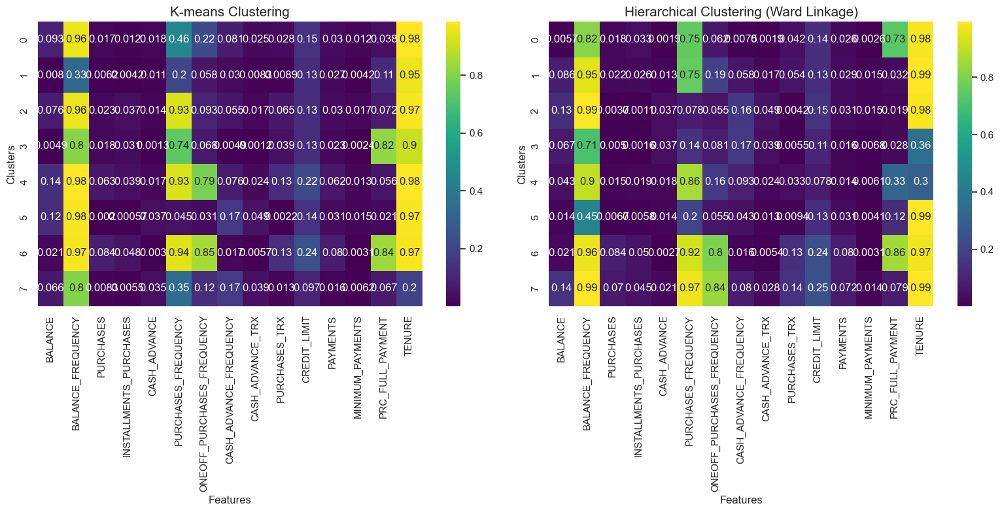

In [235]:
HeatmapFeatureMeans(data, n_clusters=8, linkage_type='ward')


In [ ]:
Because of too many clusters business insight is difficult to extract from this graph

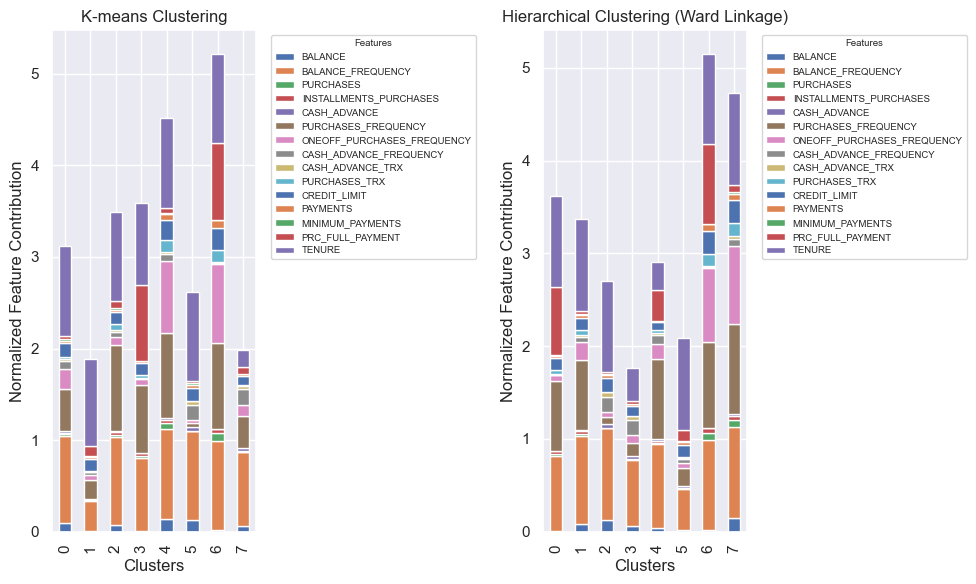

In [237]:
StackedBarPlotFeatureContributions(data, n_clusters=8, linkage_type='ward')


In [ ]:
Because of too many clusters business insight is difficult to extract from this graph

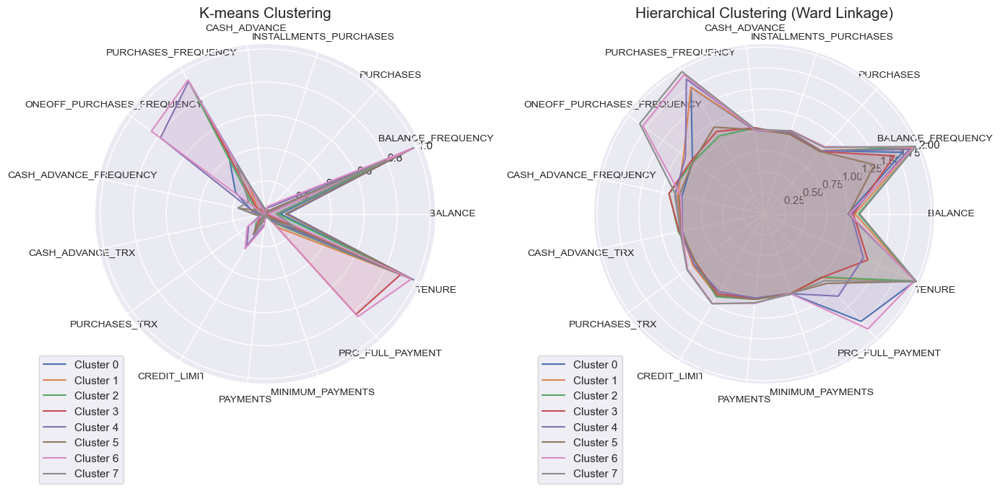

In [239]:
RadialChartFeatureMeans(data, n_clusters=8, linkage_type='ward')


Because of too many clusters business insight is difficult to extract from this graph

With Dimensionality reduction

PCA

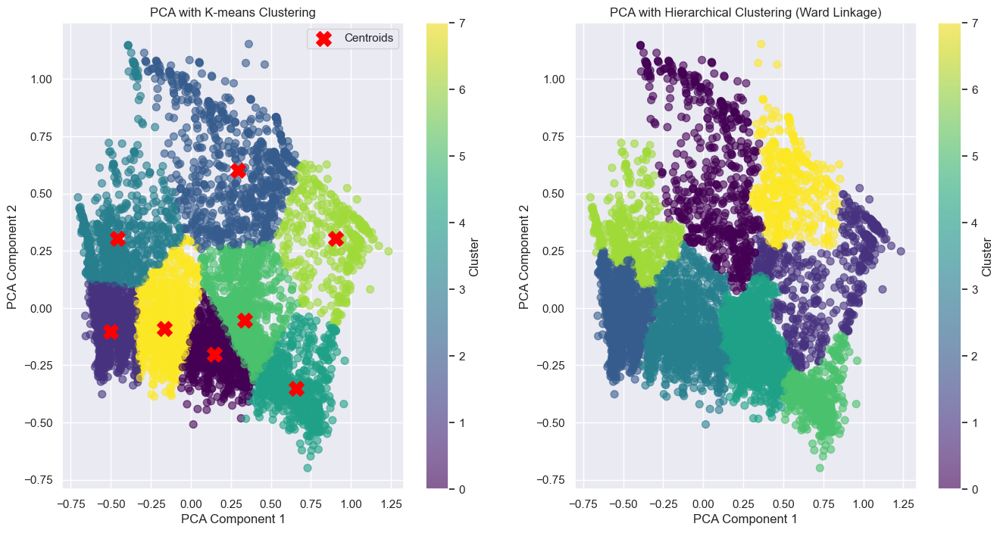

In [241]:
PCA_with_KMeans_and_Hierarchical(data, n_clusters=8, linkage_type='ward')

Because of too many clusters business insight is difficult to extract from this graph

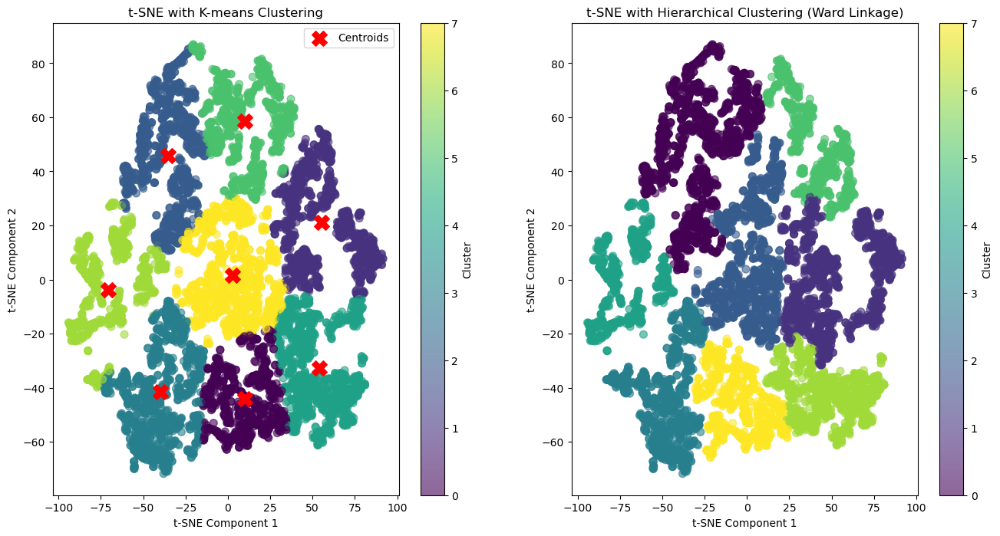

In [79]:
tSNE_with_KMeans_and_Hierarchical(data, n_clusters=8, linkage_type='ward')

In [ ]:
Because of too many clusters business insight is difficult to extract from this graph

Dendogram wrt data points

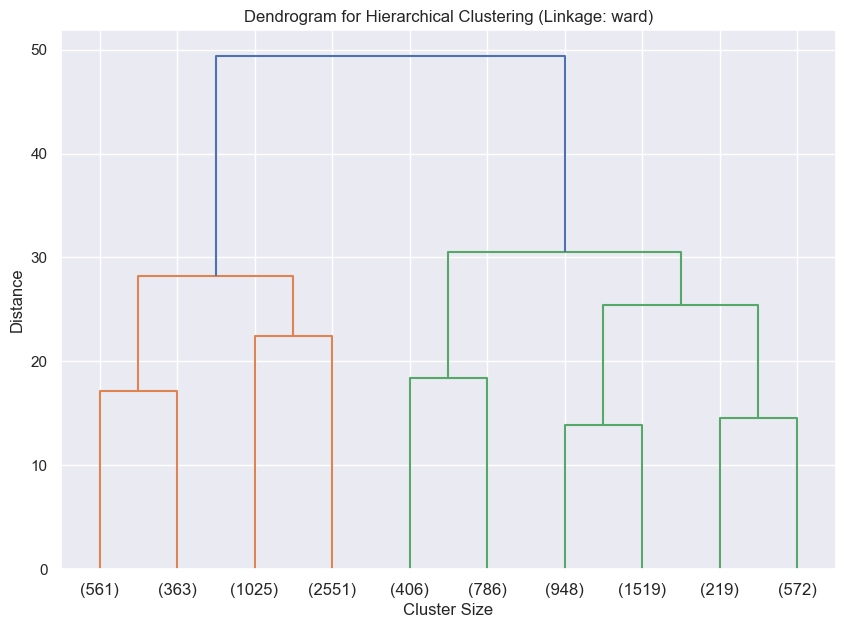

In [245]:
ClusterFun(data, linkage_method='ward')  # You can change the linkage method here.


Proper dendograms in ward linkage three clusters from above

Dendogram wrt to features

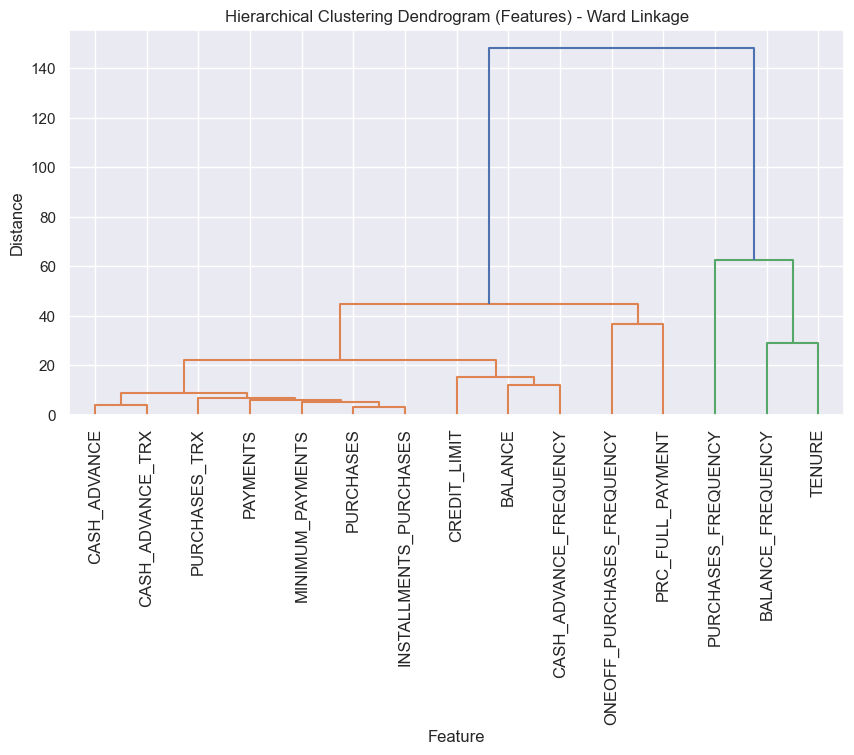

In [247]:
feature_clustering_dendrogram(data, linkage_type='ward')

In [ ]:
Proper dendograms in ward linkage two clusters from above

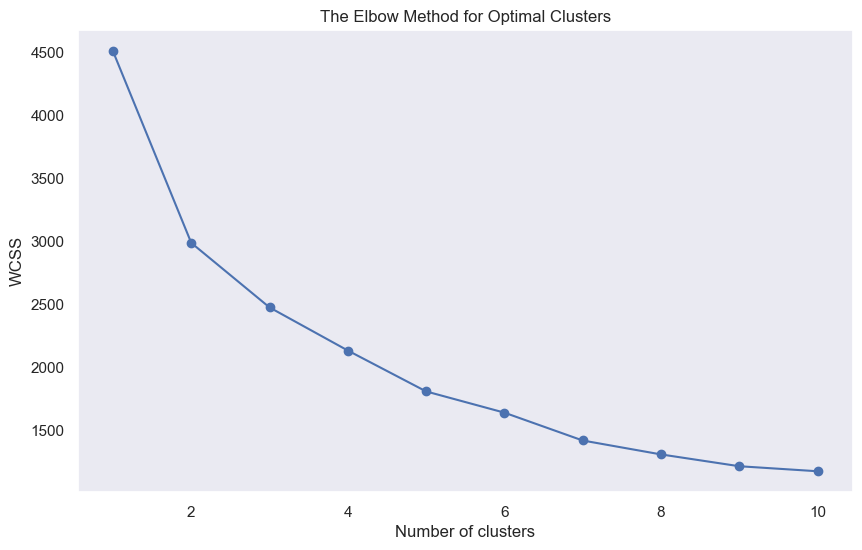

In [249]:
# Assume `data` is your 2D data structure (e.g., numpy array or DataFrame)
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module='sklearn.cluster._kmeans')
wcss = calculate_wcss(data)

# Plotting the elbow graph
plt.figure(figsize=(10, 6))
sns.set()
plt.plot(range(1, 11), wcss, marker='o')
plt.title('The Elbow Method for Optimal Clusters')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.grid()
plt.show()


2 clusters from the above elbow curve

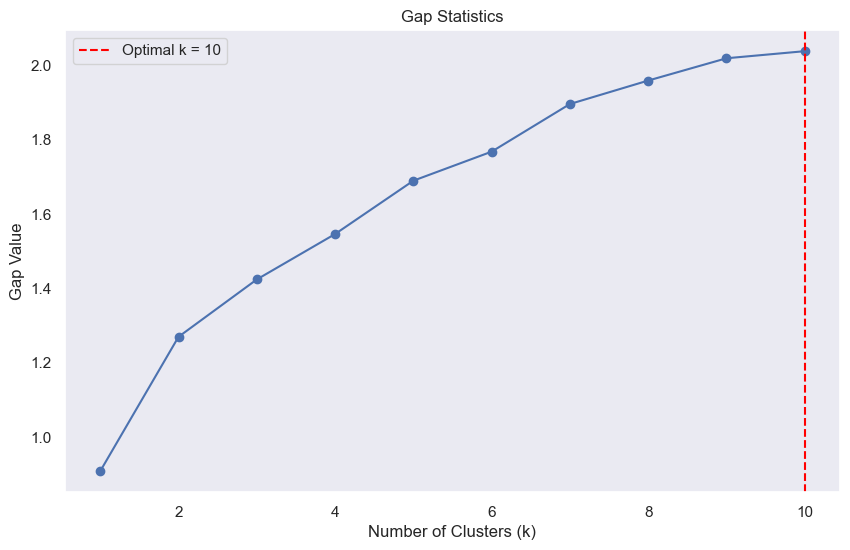

The optimal number of clusters is: 10


In [251]:
import matplotlib.pyplot as plt

# Assume `data` is your dataset (e.g., a 2D NumPy array or DataFrame)
gap_values, optimal_k = gap_statistics(data)

# Plotting the Gap Statistics
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(gap_values) + 1), gap_values, marker='o')
plt.title('Gap Statistics')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Gap Value')
plt.axvline(x=optimal_k, color='red', linestyle='--', label=f'Optimal k = {optimal_k}')
plt.legend()
plt.grid()
plt.show()

print(f'The optimal number of clusters is: {optimal_k}')


Cluster Numbers: [2, 3, 4, 5]
K-means Silhouette Scores: [0.33113693080716455, 0.3361764636772505, 0.3114261332686553, 0.32501552979548487]
Hierarchical Silhouette Scores: [0.2717526812118274, 0.24227494755674658, 0.2684640986114136, 0.2666456160554389]


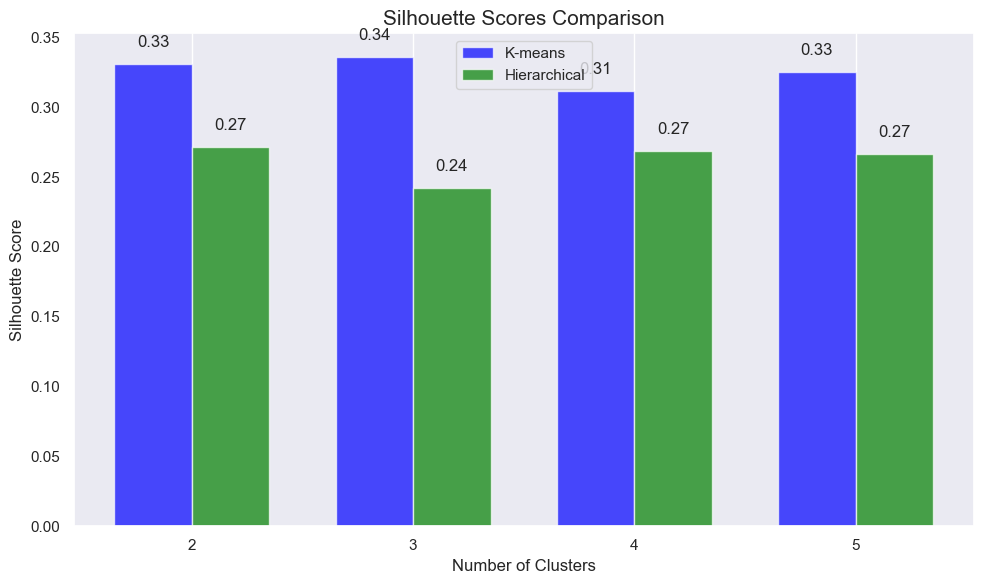

In [253]:
calculate_silhouette_scores(data, cluster_nums= [2, 3, 4, 5], linkage_type='ward')


2 clusters from the above graph

Cluster Numbers: [2, 3, 4, 5]
K-means Davies-Bouldin Index: [1.2890752233569338, 1.328341227772501, 1.202984068283894, 1.1950642346098221]
Hierarchical Davies-Bouldin Index (ward linkage): [1.4989462862983833, 1.5394670469989407, 1.4688315579034845, 1.3187201989246025]


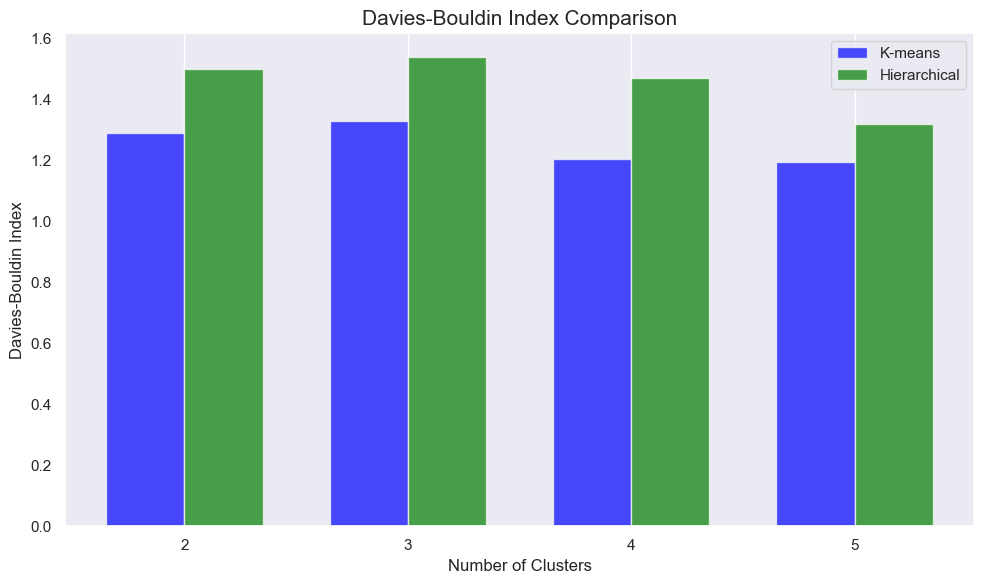

In [255]:
calculate_davies_bouldin_index(data, cluster_nums=[2, 3, 4, 5], linkage_type='ward')


2 clusters from the above graph

Post Clustering approach

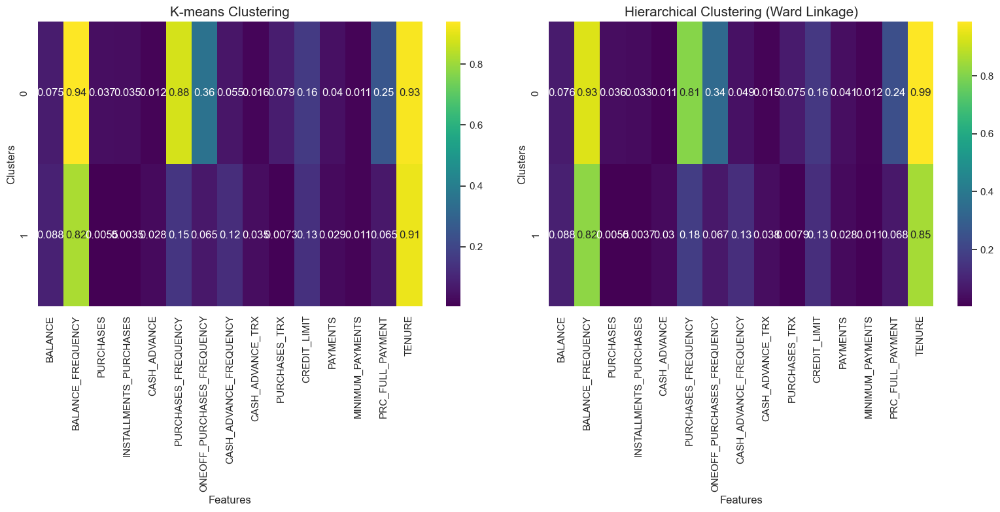

In [257]:
HeatmapFeatureMeans(data, n_clusters=2, linkage_type='ward')


In K means high spending customers are segregated in 0 cluster and low spending clusters in 1 and it is same in Hierarchical clusters major segregation can be interpreted through TENURE and Balance frequency

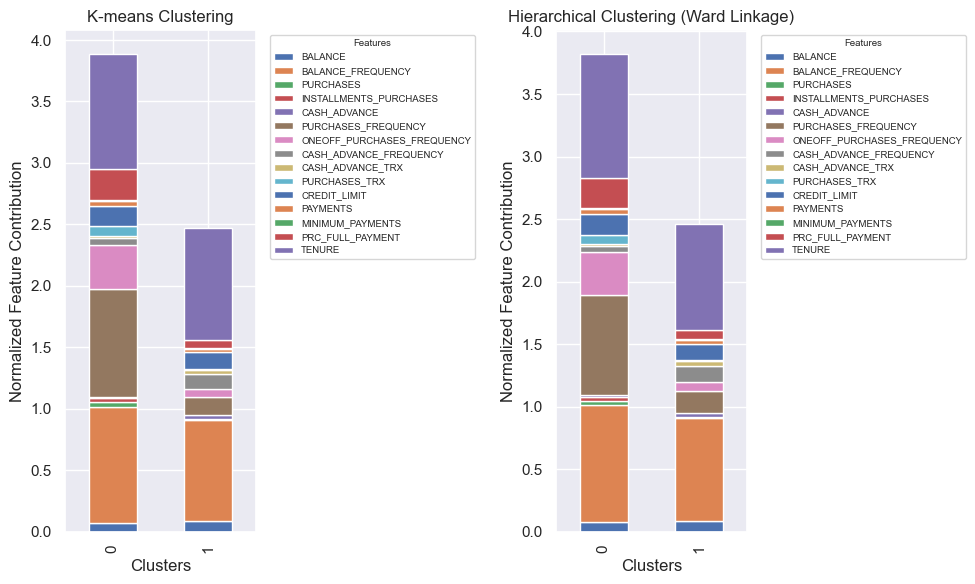

In [259]:
StackedBarPlotFeatureContributions(data, n_clusters=2, linkage_type='ward')

In K means high spending customers are segregated in 0 cluster and low spending clusters in 1 and it is same in Hierarchical clusters major segregation can be interpreted through TENURE and Balance frequency

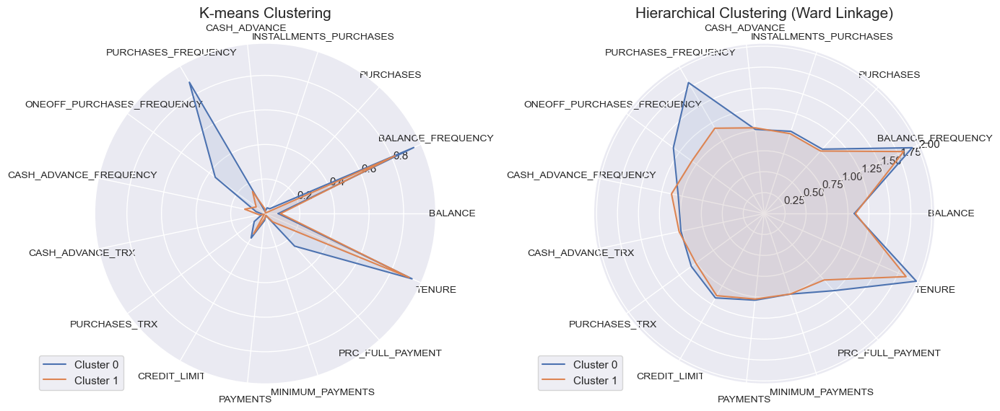

In [261]:
RadialChartFeatureMeans(data, n_clusters=2, linkage_type='ward')


In K means high spending customers are segregated in 0 cluster and low spending clusters in 1 and it is same in Hierarchical clusters major segregation can be interpreted through TENURE and Balance frequency

With dimensionality reduction

PCA

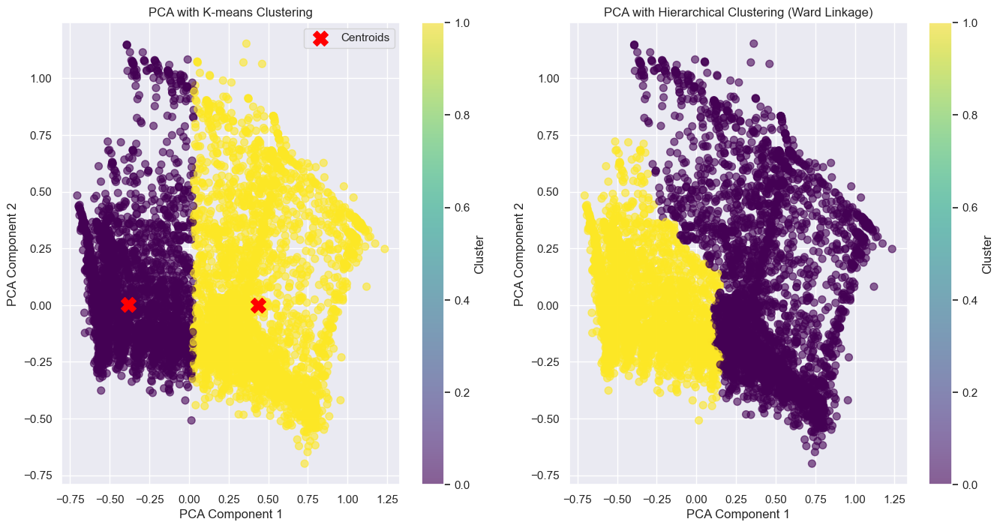

In [263]:
PCA_with_KMeans_and_Hierarchical(data, n_clusters=2, linkage_type='ward')

In [ ]:
PCA clustering is good but outliers can be seen in the clustering. 

TSNE

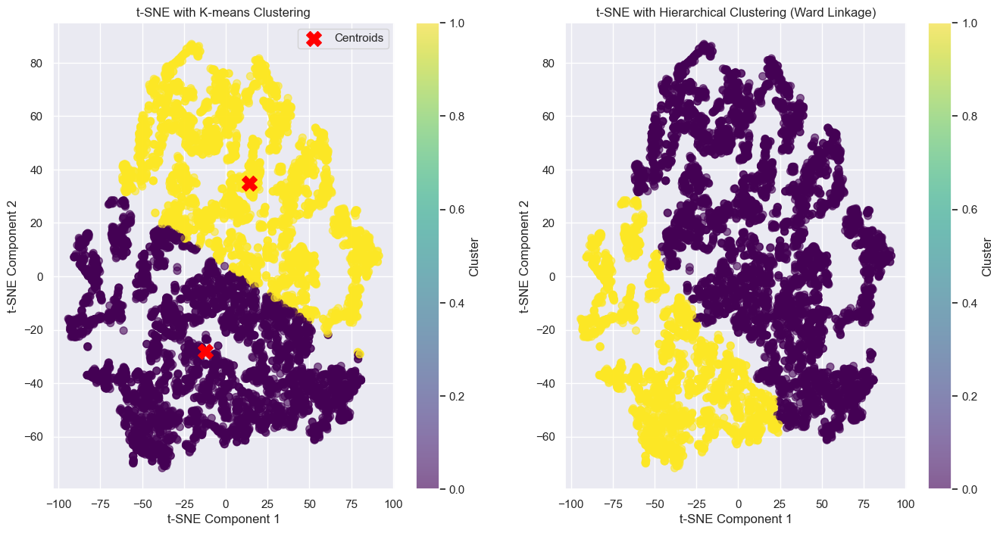

In [267]:
tSNE_with_KMeans_and_Hierarchical(data, n_clusters=2, linkage_type='ward')

In [ ]:
Proper clustering is done in TSNE in the above two tSNE clusters. 

In [ ]:
Overall interpretation is this in most of the cases K-means shows proper clustering but hierarchical clustering was not properly done. Also in the above complete linkage shows the best results